## 🦾 건설기계 오일 상태 분류 AI 경진대회

### 배경
이 경진대회는 건설기계 분야의 데이터를 분석하고 활용하는 방안을 찾아 참신한 아이디어를 발굴하며, 인공지능 기술의 발전을 도모하기 위해 마련되었습니다. 또한 건설 장비 산업의 지능화에 대한 연구활동을 홍보하고, 우수 인재를 발굴하고자 합니다.

### 주제
**실시간으로 건설장비의 작동오일 상태를 모니터링하기 위한 오일 상태 판단 모델 개발**  
(정상 및 이상 상태 이진분류)

### 설명
이번 경진대회에서는 건설 장비 내부 기계 부품의 마모 상태와 윤활 성능을 오일 데이터 분석을 통해 확인하고, AI를 활용한 분류 모델을 개발하여 적절한 오일 교체 주기를 파악하는 것이 목표입니다.

- **모델 학습 시**: 주어진 모든 특징(feature)을 사용할 수 있습니다.
- **진단 테스트 시**: 제한된 일부 특징만 사용할 수 있습니다.

제한된 특징만으로도 작동 오일의 상태를 정확하게 분류할 수 있는 최적의 알고리즘을 개발해주세요.

### 😎 라이브러리 불러오기

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams['font.family'] ='Pretendard JP'
plt.rcParams['axes.unicode_minus'] =False
import seaborn as sns

### 😎 데이터 살펴보기

In [2]:
train_COMPONENT2 = pd.read_csv("train_COMPONENT2.csv")

결측치 확인

In [3]:
train_COMPONENT2.isnull().sum()

ID                        0
COMPONENT_ARBITRARY       0
ANONYMOUS_1               0
YEAR                      0
SAMPLE_TRANSFER_DAY       0
ANONYMOUS_2               0
AG                        0
AL                        0
B                         0
BA                        0
BE                        0
CA                        0
CD                      336
CO                        0
CR                        0
CU                        0
FH2O                   2316
FNOX                   2316
FOPTIMETHGLY           2316
FOXID                  2316
FSO4                   2316
FTBN                   2316
FE                        0
FUEL                   2316
H2O                       0
K                       200
LI                        0
MG                        0
MN                        0
MO                        0
NA                        0
NI                        0
P                         0
PB                        0
PQINDEX                   0
S                   

전부 비어있는 열을 삭제한다.

In [4]:
# 결측값 비율 계산
missing_ratio = train_COMPONENT2.isnull().mean()

# 결측값이 있는 열들의 비율 출력
print("Columns with missing values and their missing ratios:")
print(missing_ratio[missing_ratio > 0])

# 결측치 비율이 50% 이상인 변수 식별
columns_to_drop = missing_ratio[missing_ratio >= 0.5].index.tolist()

# 해당 변수들을 데이터프레임에서 삭제
train_COMPONENT2 = train_COMPONENT2.drop(columns=columns_to_drop)

Columns with missing values and their missing ratios:
CD                0.145078
FH2O              1.000000
FNOX              1.000000
FOPTIMETHGLY      1.000000
FOXID             1.000000
FSO4              1.000000
FTBN              1.000000
FUEL              1.000000
K                 0.086356
SOOTPERCENTAGE    1.000000
U14               0.085492
U6                0.085492
U4                0.085492
V100              1.000000
dtype: float64


In [5]:
train_COMPONENT2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2316 entries, 0 to 2315
Data columns (total 45 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2316 non-null   object 
 1   COMPONENT_ARBITRARY  2316 non-null   object 
 2   ANONYMOUS_1          2316 non-null   int64  
 3   YEAR                 2316 non-null   int64  
 4   SAMPLE_TRANSFER_DAY  2316 non-null   int64  
 5   ANONYMOUS_2          2316 non-null   int64  
 6   AG                   2316 non-null   int64  
 7   AL                   2316 non-null   int64  
 8   B                    2316 non-null   int64  
 9   BA                   2316 non-null   int64  
 10  BE                   2316 non-null   int64  
 11  CA                   2316 non-null   int64  
 12  CD                   1980 non-null   float64
 13  CO                   2316 non-null   int64  
 14  CR                   2316 non-null   int64  
 15  CU                   2316 non-null   i

나머지 결측치를 시각화한다.

In [6]:
import klib
import pandas as pd
import seaborn as sns
import warnings
# hide warnings
warnings.filterwarnings("ignore")

<Axes: >

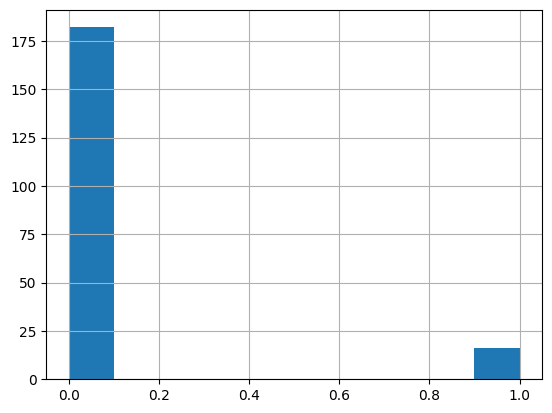

In [7]:
test_df_2 = pd.read_csv("train_COMPONENT2.csv")

test_df_2[test_df_2['U14'].isnull()]['Y_LABEL'].hist()

In [8]:
test_df_2[test_df_2['U14'].isnull()]['Y_LABEL'].value_counts(normalize=True)

Y_LABEL
0    0.919192
1    0.080808
Name: proportion, dtype: float64

In [9]:
test_df_2[~test_df_2['U14'].isnull()]['Y_LABEL'].value_counts(normalize=True)

Y_LABEL
0    0.910293
1    0.089707
Name: proportion, dtype: float64

GridSpec(6, 6)

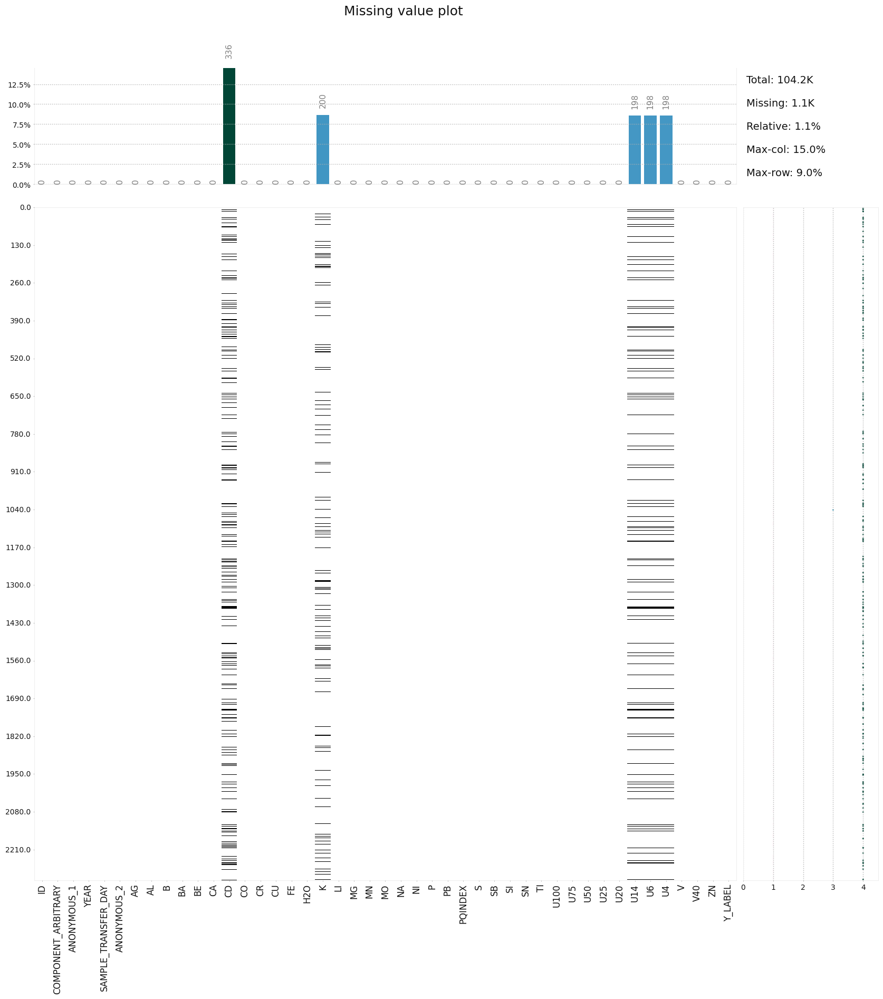

In [10]:
klib.missingval_plot(train_COMPONENT2)

In [11]:
train_COMPONENT2 = train_COMPONENT2.dropna(subset=train_COMPONENT2.columns[train_COMPONENT2.isnull().any()])

In [12]:
train_COMPONENT2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1779 entries, 1 to 2315
Data columns (total 45 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   1779 non-null   object 
 1   COMPONENT_ARBITRARY  1779 non-null   object 
 2   ANONYMOUS_1          1779 non-null   int64  
 3   YEAR                 1779 non-null   int64  
 4   SAMPLE_TRANSFER_DAY  1779 non-null   int64  
 5   ANONYMOUS_2          1779 non-null   int64  
 6   AG                   1779 non-null   int64  
 7   AL                   1779 non-null   int64  
 8   B                    1779 non-null   int64  
 9   BA                   1779 non-null   int64  
 10  BE                   1779 non-null   int64  
 11  CA                   1779 non-null   int64  
 12  CD                   1779 non-null   float64
 13  CO                   1779 non-null   int64  
 14  CR                   1779 non-null   int64  
 15  CU                   1779 non-null   int64 

2315에서 1779로 줄어듦.

In [13]:
# 초기 값과 최종 값
initial_value = 2315
final_value = 1779

# 절대 감소량 계산
absolute_reduction = initial_value - final_value

# 상대 감소율 계산
relative_reduction_percentage = (absolute_reduction / initial_value) * 100

# 결과 출력
print(f"Relative Reduction Percentage: {relative_reduction_percentage:.2f}%")

Relative Reduction Percentage: 23.15%


### 👌 컴포넌트1 코드 통합

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams['font.family'] ='Pretendard JP'
data = pd.read_csv('train_COMPONENT1.csv')

In [ ]:
data_corr = data.drop(columns=['ID','COMPONENT_ARBITRARY'])

In [ ]:
# 전체 변수간 상관관계
plt.figure(figsize=(10,10))
sns.heatmap(data_corr.corr(), cmap='bwr')
plt.title('상관행렬')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams['font.family'] ='Pretendard JP'
plt.rcParams['axes.unicode_minus'] = False  # 마이너스 기호 정상 출력 설정
# Calculate the proportion of missing values for each feature and sort in descending order
missing_proportions = data.isnull().mean().sort_values(ascending=False) * 100

# Select top 18 features with the highest missing proportions
top_missing_proportions = missing_proportions.head(19)

# Plot the missing value proportions for top 18 features with title and labels in Korean
plt.figure(figsize=(12, 6))
colors = plt.cm.tab20(range(len(top_missing_proportions)))
ax = top_missing_proportions.plot(kind='bar', color=colors, width=0.8)
#ax = top_missing_proportions.plot(kind='bar', color='lightblue')

plt.title('피처별 결측치 비율 ')
plt.xlabel('피처')
plt.ylabel('결측 비율 (%)')
plt.xticks(rotation=45)

# Add the missing proportion labels on top of the bars
for i in ax.containers:
    ax.bar_label(i, fmt='%.f%%', label_type="edge")

plt.show()

In [ ]:
# 결측치가 있는 변수 개수 파악

mis_val = data.isnull().sum()
mis_val_bool = mis_val >= 1
mis_val_df = pd.concat([mis_val, mis_val_bool], axis = 1)
mis_val_df = mis_val_df.rename(columns = {0 : 'mis_val', 1 : 'mis_val_bool'})

print("결측이 있는 변수")
print(mis_val_df['mis_val_bool'].value_counts())

In [ ]:
# Check for missing values in the dataset
missing_values = data.isnull().sum()

# Filter columns with missing values
missing_values = missing_values[missing_values > 0]

In [ ]:
missing_values

In [ ]:
# Calculate the percentage of missing values for each column
missing_percentage = (missing_values / len(data)) * 100

# Create a DataFrame to display missing values and their percentages
missing_df = pd.DataFrame({
    'Missing Values': missing_values,
    'Percentage': missing_percentage
})

In [ ]:
# Correcting the code to drop columns with 100% missing values
columns_to_drop = missing_df[missing_df['Percentage'] == 100].index
data_cleaned = data.drop(columns=columns_to_drop)

# Verify the columns have been dropped
cleaned_columns = data_cleaned.columns

cleaned_columns

In [ ]:
# Dropping the 'ID' column
data_cleaned = data_cleaned.drop(columns=['ID','COMPONENT_ARBITRARY'])

# Verify the column has been dropped
cleaned_columns = data_cleaned.columns

cleaned_columns

In [ ]:
data_cleaned=data_cleaned.dropna()

In [ ]:
used_columns = data_cleaned.columns.tolist()
print(used_columns)

In [ ]:
# 필요 라이브러리 설치
# !pip install pycaret

import pandas as pd
from pycaret.classification import *
from sklearn.preprocessing import *
# 데이터 로드
# PyCaret 설정
#clf1 = setup(data_resampled, target='Y_LABEL', session_id=123)

setup_clf = setup(data_cleaned, target = 'Y_LABEL',
                  train_size = 0.7,
                  normalize = True,
                  normalize_method = 'zscore',
                  ignore_features = ['YEAR', 'SAMPLE_TRANSFER_DAY'],
                  n_jobs = - 1,
                  session_id = 42)

# F1 스코어에 따라 최적 모델 선택
best_model = compare_models()

# 최적 모델 정보 출력
print(best_model)

# 최적 모델로 예측 수행
predictions = predict_model(best_model)
print(predictions)

# 최적 모델 저장
save_model(best_model, 'best_model_pycaret')

In [ ]:
best_model

In [ ]:
import ssl
ssl._create_default_https_context = ssl._create_unverified_context
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_auc_score
from lightgbm import LGBMClassifier

In [ ]:
## 1. 전처리 함수 (앞으로 계속 로직이 추가될 예정)

## 2. 데이터 분리 함수
def get_train_test_dataset(df):
    # 인자로 입력된 DataFrame의 사전 데이터 가공이 완료된 복사 DataFrame 반환
    # DataFrame의 맨 마지막 컬럼이 종속변수, 나머지는 독립변수
    X_features = df.iloc[:, :-1]
    y_target = df.iloc[:, -1]

    ## train_test_split()으로 학습과 테스트 데이터 분할.
    ## stratify=y_target으로 Stratified 기반 분할.
    X_train, X_test, y_train, y_test = train_test_split(X_features, 
                                                        y_target, 
                                                        test_size=0.3, 
                                                        random_state=0, 
                                                        # stratify=y_target # Stratified 기법
                                                        )
    return X_train, X_test, y_train, y_test

## 3. 모델성능 평가 함수
def get_clf_eval(y_test, pred=None, pred_proba=None):
    accuracy = accuracy_score(y_test , pred)
    precision = precision_score(y_test , pred)
    recall = recall_score(y_test , pred)
    f1 = f1_score(y_test,pred)
    f1_macro = f1_score(y_test, pred, average='macro')

    print('정확도: {0:.4f}, 정밀도: {1:.4f}, 재현율: {2:.4f}, F1: {3:.4f}, 매크로 F1: {4:.4f}'.format(accuracy, precision, recall, f1, f1_macro))

## 4. 모델 학습 및 평가 함수
def get_model_train_eval(model, X_feature_train=None, X_feature_test=None, Y_feature_train=None, Y_feature_test=None):
    model.fit(X_feature_train, Y_feature_train)
    pred = model.predict(X_feature_test)
    pred_proba = model.predict_proba(X_feature_test)[:, 1]
    get_clf_eval(Y_feature_test, pred, pred_proba)

#### 피쳐임포턴스를 통해 상위 20개만 선택!

In [ ]:
best_model = LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=42, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from pycaret.classification import load_model

# 이미 학습된 모델 로드
# best_model = load_model('best_model_pycaret')

# feature_names를 가져올 때, 모델의 입력 데이터프레임과 동일한지 확인
# 모델 학습 시 사용된 데이터프레임 (X_train)을 가져와야 함

# 예시: feature_names를 모델의 booster로부터 직접 가져오기
feature_names = best_model.feature_name_

# 피쳐 임포턴스 가져오기
importances = best_model.feature_importances_

# 피쳐 임포턴스를 데이터프레임으로 변환
feature_importance_df = pd.DataFrame({'feature': feature_names, 'importance': importances})
feature_importance_df = feature_importance_df[feature_importance_df['feature'] != 'YEAR']

# 피쳐 임포턴스 정렬
feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False)

# 피쳐 임포턴스 시각화
plt.figure(figsize=(12, 8))
plt.barh(feature_importance_df['feature'], feature_importance_df['importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.gca().invert_yaxis()
plt.show()

In [ ]:
# 피쳐 임포턴스를 정렬하여 상위 20개 선택
top_20_features = feature_importance_df.sort_values(by='importance', ascending=False).head(20)

# 상위 20개의 피쳐 임포턴스 변수에 저장
top_20_features_list = top_20_features.to_dict('records')

# 상위 20개의 피쳐 임포턴스 출력
print("Top 20 Feature Importances:")
print(top_20_features)

In [ ]:
# 1
top_20_features = [
    'AL', 'ANONYMOUS_1', 'CA', 'B', 'ZN', 'P', 'MO', 'FTBN', 'S', 'PQINDEX', 
    'FE', 'MG', 'V40', 'V100', 'FH2O', 'NA', 'K', 'SOOTPERCENTAGE', 'ANONYMOUS_2', 'CU', 'Y_LABEL'
]

# 상위 20개의 피쳐만 포함된 새로운 데이터프레임 생성
data_top_20 = data_cleaned[top_20_features]

# 새로운 데이터프레임 확인
print(data_top_20.head())

In [ ]:
df = pd.DataFrame(data_top_20)

In [ ]:
from sklearn.metrics import f1_score, make_scorer

In [ ]:
X_features = data_top_20.iloc[:, :-1]
y_target = data_top_20.iloc[:, -1]

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = get_train_test_dataset(data_top_20)

In [ ]:
# CatBoostClassifier 모델 초기화
LGBMClassifier_clf = LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=42, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)

get_model_train_eval(LGBMClassifier_clf, X_feature_train=X_train, X_feature_test=X_test, Y_feature_train=y_train, Y_feature_test=y_test)

### 👌 컴포넌트2 코드 통합

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams['font.family'] ='Pretendard JP'
data = pd.read_csv('train_COMPONENT3.csv')

In [ ]:
data_corr = data.drop(columns=['ID','COMPONENT_ARBITRARY'])

In [ ]:
# 전체 변수간 상관관계
plt.figure(figsize=(10,10))
sns.heatmap(data_corr.corr(), cmap='bwr')
plt.title('상관행렬')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams['font.family'] ='Pretendard JP'
plt.rcParams['axes.unicode_minus'] = False  # 마이너스 기호 정상 출력 설정
# Calculate the proportion of missing values for each feature and sort in descending order
missing_proportions = data.isnull().mean().sort_values(ascending=False) * 100

# Select top 18 features with the highest missing proportions
top_missing_proportions = missing_proportions.head(19)

# Plot the missing value proportions for top 18 features with title and labels in Korean
plt.figure(figsize=(12, 6))
colors = plt.cm.tab20(range(len(top_missing_proportions)))
ax = top_missing_proportions.plot(kind='bar', color=colors, width=0.8)
#ax = top_missing_proportions.plot(kind='bar', color='lightblue')

plt.title('피처별 결측치 비율 ')
plt.xlabel('피처')
plt.ylabel('결측 비율 (%)')
plt.xticks(rotation=45)

# Add the missing proportion labels on top of the bars
for i in ax.containers:
    ax.bar_label(i, fmt='%.f%%', label_type="edge")

plt.show()

In [ ]:
# 결측치가 있는 변수 개수 파악

mis_val = data.isnull().sum()
mis_val_bool = mis_val >= 1
mis_val_df = pd.concat([mis_val, mis_val_bool], axis = 1)
mis_val_df = mis_val_df.rename(columns = {0 : 'mis_val', 1 : 'mis_val_bool'})

print("결측이 있는 변수")
print(mis_val_df['mis_val_bool'].value_counts())

In [ ]:
# Check for missing values in the dataset
missing_values = data.isnull().sum()

# Filter columns with missing values
missing_values = missing_values[missing_values > 0]

In [ ]:
missing_values

In [ ]:
# Calculate the percentage of missing values for each column
missing_percentage = (missing_values / len(data)) * 100

# Create a DataFrame to display missing values and their percentages
missing_df = pd.DataFrame({
    'Missing Values': missing_values,
    'Percentage': missing_percentage
})

In [ ]:
# Correcting the code to drop columns with 100% missing values
columns_to_drop = missing_df[missing_df['Percentage'] == 100].index
data_cleaned = data.drop(columns=columns_to_drop)

# Verify the columns have been dropped
cleaned_columns = data_cleaned.columns

cleaned_columns

In [ ]:
columns_to_drop

In [ ]:
# Dropping the 'ID' column
data_cleaned = data_cleaned.drop(columns=['ID','COMPONENT_ARBITRARY'])

# Verify the column has been dropped
cleaned_columns = data_cleaned.columns

cleaned_columns

In [ ]:
data_cleaned=data_cleaned.dropna()

In [ ]:
data_cleaned.info()

In [ ]:
used_columns = data_cleaned.columns.tolist()
print(used_columns)

In [ ]:
data_cleaned.columns

In [ ]:
# 필요 라이브러리 설치
# !pip install pycaret

import pandas as pd
from pycaret.classification import *
from sklearn.preprocessing import *
# 데이터 로드
# PyCaret 설정
#clf1 = setup(data_resampled, target='Y_LABEL', session_id=123)

setup_clf = setup(data_cleaned, target = 'Y_LABEL',
                  train_size = 0.7,
                  normalize = True,
                  normalize_method = 'zscore',
                  ignore_features = ['YEAR', 'SAMPLE_TRANSFER_DAY'],
                  n_jobs = - 1,
                  session_id = 42)

# F1 스코어에 따라 최적 모델 선택
best_model = compare_models()

# 최적 모델 정보 출력
print(best_model)

# 최적 모델로 예측 수행
predictions = predict_model(best_model)
print(predictions)

# 최적 모델 저장
save_model(best_model, 'best_model_pycaret')

In [ ]:
best_model

In [ ]:
import ssl
ssl._create_default_https_context = ssl._create_unverified_context
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_auc_score
from lightgbm import LGBMClassifier

In [ ]:
## 1. 전처리 함수 (앞으로 계속 로직이 추가될 예정)

## 2. 데이터 분리 함수
def get_train_test_dataset(df):
    # 인자로 입력된 DataFrame의 사전 데이터 가공이 완료된 복사 DataFrame 반환
    # DataFrame의 맨 마지막 컬럼이 종속변수, 나머지는 독립변수
    X_features = df.iloc[:, :-1]
    y_target = df.iloc[:, -1]

    ## train_test_split()으로 학습과 테스트 데이터 분할.
    ## stratify=y_target으로 Stratified 기반 분할.
    X_train, X_test, y_train, y_test = train_test_split(X_features, 
                                                        y_target, 
                                                        test_size=0.3, 
                                                        random_state=0, 
                                                        # stratify=y_target # Stratified 기법
                                                        )
    return X_train, X_test, y_train, y_test

## 3. 모델성능 평가 함수
def get_clf_eval(y_test, pred=None, pred_proba=None):
    accuracy = accuracy_score(y_test , pred)
    precision = precision_score(y_test , pred)
    recall = recall_score(y_test , pred)
    f1 = f1_score(y_test,pred)
    f1_macro = f1_score(y_test, pred, average='macro')

    print('정확도: {0:.4f}, 정밀도: {1:.4f}, 재현율: {2:.4f}, F1: {3:.4f}, 매크로 F1: {4:.4f}'.format(accuracy, precision, recall, f1, f1_macro))

## 4. 모델 학습 및 평가 함수
def get_model_train_eval(model, X_feature_train=None, X_feature_test=None, Y_feature_train=None, Y_feature_test=None):
    model.fit(X_feature_train, Y_feature_train)
    pred = model.predict(X_feature_test)
    pred_proba = model.predict_proba(X_feature_test)[:, 1]
    get_clf_eval(Y_feature_test, pred, pred_proba)

#### 피쳐임포턴스를 통해 상위 20개만 선택!

In [ ]:
best_model = LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=42, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from pycaret.classification import load_model

# 이미 학습된 모델 로드
# best_model = load_model('best_model_pycaret')

# feature_names를 가져올 때, 모델의 입력 데이터프레임과 동일한지 확인
# 모델 학습 시 사용된 데이터프레임 (X_train)을 가져와야 함

# 예시: feature_names를 모델의 booster로부터 직접 가져오기
feature_names = best_model.feature_name_

# 피쳐 임포턴스 가져오기
importances = best_model.feature_importances_

# 피쳐 임포턴스를 데이터프레임으로 변환
feature_importance_df = pd.DataFrame({'feature': feature_names, 'importance': importances})
feature_importance_df = feature_importance_df[feature_importance_df['feature'] != 'YEAR']

# 피쳐 임포턴스 정렬
feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False)

# 피쳐 임포턴스 시각화
plt.figure(figsize=(12, 8))
plt.barh(feature_importance_df['feature'], feature_importance_df['importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.gca().invert_yaxis()
plt.show()

In [ ]:
# 피쳐 임포턴스를 정렬하여 상위 20개 선택
top_20_features = feature_importance_df.sort_values(by='importance', ascending=False).head(20)

# 상위 20개의 피쳐 임포턴스 변수에 저장
top_20_features_list = top_20_features.to_dict('records')

# 상위 20개의 피쳐 임포턴스 출력
print("Top 20 Feature Importances:")
print(top_20_features)

In [ ]:
# 1
top_20_features = [
    'AL', 'ANONYMOUS_1', 'CA', 'B', 'ZN', 'P', 'MO', 'FTBN', 'S', 'PQINDEX', 
    'FE', 'MG', 'V40', 'V100', 'FH2O', 'NA', 'K', 'SOOTPERCENTAGE', 'ANONYMOUS_2', 'CU', 'Y_LABEL'
]

# 상위 20개의 피쳐만 포함된 새로운 데이터프레임 생성
data_top_20 = data_cleaned[top_20_features]

# 새로운 데이터프레임 확인
print(data_top_20.head())

In [ ]:
df = pd.DataFrame(data_top_20)

In [ ]:
from sklearn.metrics import f1_score, make_scorer

In [ ]:
X_features = data_top_20.iloc[:, :-1]
y_target = data_top_20.iloc[:, -1]

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = get_train_test_dataset(data_top_20)

In [ ]:
# CatBoostClassifier 모델 초기화
LGBMClassifier_clf = LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=42, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)

get_model_train_eval(LGBMClassifier_clf, X_feature_train=X_train, X_feature_test=X_test, Y_feature_train=y_train, Y_feature_test=y_test)

In [ ]:
from imblearn.over_sampling import SMOTE

## 1. SMOTE 정의
smote = SMOTE(random_state=0)
## 2. SMOTE 적용
X_train_over, y_train_over = smote.fit_resample(X_train, y_train)

In [ ]:
from catboost import CatBoostClassifier
      
# CatBoostClassifier 모델 초기화
LGBMClassifier_clf = LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=42, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)

get_model_train_eval(LGBMClassifier_clf, X_feature_train=X_train_over, X_feature_test=X_test, Y_feature_train=y_train_over, Y_feature_test=y_test)

#### 최종 모델링 파일 저장

In [ ]:
import joblib
model_filename = 'LGBMClassifier_model_2.pkl'
joblib.dump(LGBMClassifier_clf, model_filename)

### 👌 컴포넌트3 코드 통합

In [ ]:
import pandas as pd

# Load the dataset
file_path = './train_COMPONENT3.csv'
#file_path = r'C:\Users\USER\Documents\카카오톡 받은 파일\train_COMPONENT3.csv'

data = pd.read_csv(file_path)

In [ ]:
# Check the distribution of Y_LABEL in the actual data to identify any data bias
y_label_counts = data['Y_LABEL'].value_counts()
plt.rcParams['font.family'] = 'Malgun Gothic'  # 한글 폰트 설정
plt.rcParams['axes.unicode_minus'] = False  # 마이너스 기호 정상 출력 설정
# Plot the distribution of Y_LABEL
plt.figure(figsize=(8, 5))
ax = y_label_counts.plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Y_LABEL 데이터 분포')
plt.xlabel('Y_LABEL 값')
plt.ylabel('개수')
plt.xticks(rotation=0)

# Add the counts on top of the bars
for i in ax.containers:
    ax.bar_label(i, label_type="edge")

plt.show()

y_label_counts

In [ ]:
# 결측치가 있는 변수 개수 파악

mis_val = data.isnull().sum()
mis_val_bool = mis_val >= 1
mis_val_df = pd.concat([mis_val, mis_val_bool], axis = 1)
mis_val_df = mis_val_df.rename(columns = {0 : 'mis_val', 1 : 'mis_val_bool'})

print("결측이 있는 변수")
print(mis_val_df['mis_val_bool'].value_counts())

In [ ]:
# Check for missing values in the dataset
missing_values = data.isnull().sum()

# Filter columns with missing values
missing_values = missing_values[missing_values > 0]

In [ ]:
# Calculate the percentage of missing values for each column
missing_percentage = (missing_values / len(data)) * 100

# Create a DataFrame to display missing values and their percentages
missing_df = pd.DataFrame({
    'Missing Values': missing_values,
    'Percentage': missing_percentage
})

In [ ]:
# Correcting the code to drop columns with 100% missing values
columns_to_drop = missing_df[missing_df['Percentage'] == 100].index
data_cleaned = data.drop(columns=columns_to_drop)

# Verify the columns have been dropped
cleaned_columns = data_cleaned.columns

cleaned_columns

In [ ]:
# Dropping the 'ID' column
data_cleaned = data_cleaned.drop(columns=['ID','COMPONENT_ARBITRARY'])

# Verify the column has been dropped
cleaned_columns = data_cleaned.columns

cleaned_columns

In [ ]:
data_cleaned=data_cleaned.dropna()

In [ ]:
data_cleaned.columns

In [ ]:
# 필요 라이브러리 설치
# !pip install pycaret

import pandas as pd
from pycaret.classification import *
from sklearn.preprocessing import *
# 데이터 로드
# PyCaret 설정
#clf1 = setup(data_resampled, target='Y_LABEL', session_id=123)

setup_clf = setup(data_cleaned, target = 'Y_LABEL',
                  train_size = 0.7,
                  normalize = True,
                  normalize_method = 'zscore',
                  ignore_features = ['year', 'SAMPLE_TRANSFER_DAY'],
                  n_jobs = - 1,
                  session_id = 42)


# 비교를 통해 최적 모델 선택
best_model = compare_models()

# 최적 모델 정보 출력
print(best_model)

# 최적 모델로 예측 수행
predictions = predict_model(best_model)
print(predictions)

# 최적 모델 저장
save_model(best_model, 'best_model_pycaret')

In [ ]:
best_model

In [ ]:
import ssl
ssl._create_default_https_context = ssl._create_unverified_context
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_auc_score
from lightgbm import LGBMClassifier

In [ ]:
X_features = data_cleaned.iloc[:, :-1]
y_target = data_cleaned.iloc[:, -1]

In [ ]:
## 1. 전처리 함수 (앞으로 계속 로직이 추가될 예정)

## 2. 데이터 분리 함수
def get_train_test_dataset(df):
    # 인자로 입력된 DataFrame의 사전 데이터 가공이 완료된 복사 DataFrame 반환
    # DataFrame의 맨 마지막 컬럼이 종속변수, 나머지는 독립변수
    X_features = df.iloc[:, :-1]
    y_target = df.iloc[:, -1]

    ## train_test_split()으로 학습과 테스트 데이터 분할.
    ## stratify=y_target으로 Stratified 기반 분할.
    X_train, X_test, y_train, y_test = train_test_split(X_features, 
                                                        y_target, 
                                                        test_size=0.3, 
                                                        random_state=0, 
                                                        # stratify=y_target # Stratified 기법
                                                        )
    return X_train, X_test, y_train, y_test

## 3. 모델성능 평가 함수
def get_clf_eval(y_test, pred=None, pred_proba=None):
    accuracy = accuracy_score(y_test , pred)
    precision = precision_score(y_test , pred)
    recall = recall_score(y_test , pred)
    f1 = f1_score(y_test,pred)
    f1_macro = f1_score(y_test, pred, average='macro')

    print('정확도: {0:.4f}, 정밀도: {1:.4f}, 재현율: {2:.4f}, F1: {3:.4f}, 매크로 F1: {4:.4f}'.format(accuracy, precision, recall, f1, f1_macro))

## 4. 모델 학습 및 평가 함수
def get_model_train_eval(model, X_feature_train=None, X_feature_test=None, Y_feature_train=None, Y_feature_test=None):
    model.fit(X_feature_train, Y_feature_train)
    pred = model.predict(X_feature_test)
    pred_proba = model.predict_proba(X_feature_test)[:, 1]
    get_clf_eval(Y_feature_test, pred, pred_proba)

In [ ]:
import xgboost as xgb
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# 데이터 로드
X = data_cleaned.drop('Y_LABEL', axis=1)
y = data_cleaned['Y_LABEL']

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# XGBoost 모델 훈련
model = xgb.XGBClassifier(objective='binary:logistic', random_state=42)
model.fit(X_train, y_train)

# 변수 중요도 추출
feature_importances = model.feature_importances_

In [ ]:
# 변수 중요도 시각화
features = X_train.columns
importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# 막대 그래프로 시각화
plt.figure(figsize=(10, 8))
plt.barh(importance_df['Feature'], importance_df['Importance'])
plt.xlabel('Importance')
plt.title('Feature Importance')
plt.gca().invert_yaxis()  # y축 순서 뒤집기
plt.show()

In [ ]:
# 피쳐 임포턴스를 정렬하여 상위 20개 선택
top_20_features = feature_importance_df.sort_values(by='importance', ascending=False).head(20)

# 상위 20개의 피쳐 임포턴스 변수에 저장
top_20_features_list = top_20_features.to_dict('records')

# 상위 20개의 피쳐 임포턴스 출력
print("Top 20 Feature Importances:")
print(top_20_features)

In [ ]:
top_20_features = [
    'CA', 'ANONYMOUS_1', 'AL', 'PQINDEX', 'P', 'FE', 'V40', 'ZN', 'B',
    'S', 'SI', 'MO', 'NA', 'CU', 'ANONYMOUS_2', 'BA', 'MG', 'K', 'CR','MN','Y_LABEL'
]

# 상위 20개의 피쳐만 포함된 새로운 데이터프레임 생성
data_top_20 = data_cleaned[top_20_features]

# 새로운 데이터프레임 확인
print(data_top_20.head())

In [ ]:
# 각 컬럼에 대해 상하위 0.1% 이상치 제거 전의 데이터 개수 저장
initial_count = len(data_top_20)

# 각 컬럼에 대해 상하위 0.1% 이상치 제거
for column in data_top_20.columns:
    # 상위 0.1%와 하위 0.1%의 경계값 계산
    lower_bound = data_top_20[column].quantile(0.001)
    upper_bound = data_top_20[column].quantile(0.999)

    # 경계값을 벗어나는 데이터를 이상치로 간주하고 제거
    data_top_20 = data_top_20[(data_top_20[column] >= lower_bound) & (data_top_20[column] <= upper_bound)]

# 이상치가 제거된 후의 데이터 개수 저장
final_count = len(data_top_20)

# 제거된 이상치 개수 계산
removed_outliers = initial_count - final_count

# 이상치가 제거된 데이터 확인
print(data_top_20.describe())

# 제거된 이상치 개수 출력
print(f'Number of outliers removed: {removed_outliers}')

In [ ]:
df = pd.DataFrame(data_top_20)

# CSV 파일로 저장
csv_filename = 'component3_preprocessed_final.csv'
df.to_csv(csv_filename, index=False, encoding='utf-8')

### 😎 각각의 컴포넌트 데이터셋의 0과 1의 분포를 시각화로 확인.

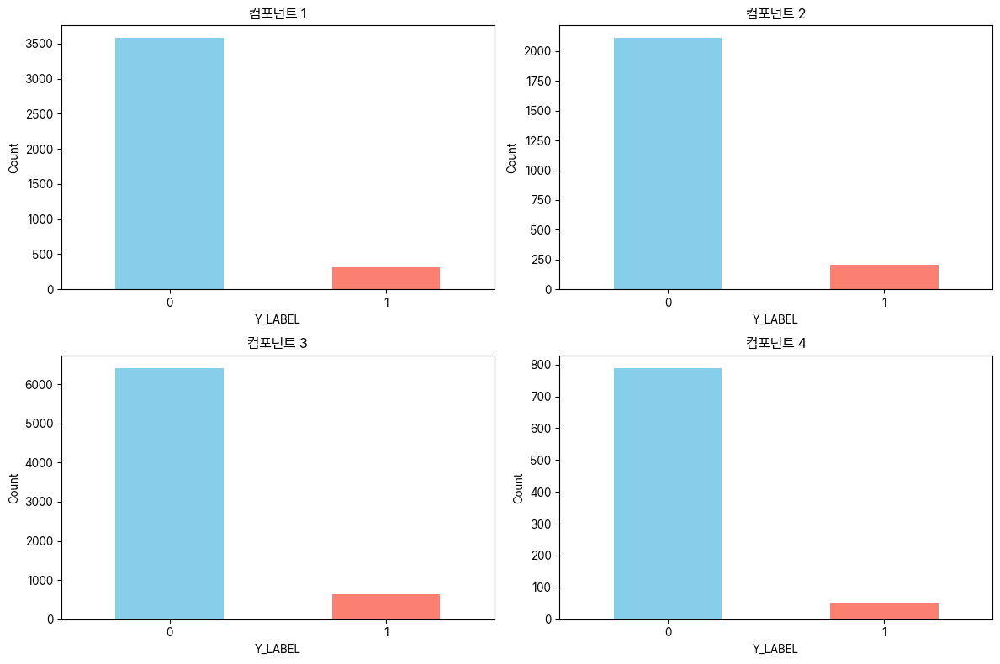

In [28]:
# 데이터셋 로드
train_COMPONENT1 = pd.read_csv("train_COMPONENT1.csv")
train_COMPONENT2 = pd.read_csv("train_COMPONENT2.csv")
train_COMPONENT3 = pd.read_csv("train_COMPONENT3.csv")
train_COMPONENT4 = pd.read_csv("train_COMPONENT4.csv")

# 데이터셋 리스트
datasets = [train_COMPONENT1, train_COMPONENT2, train_COMPONENT3, train_COMPONENT4]
titles = ['컴포넌트 1', '컴포넌트 2', '컴포넌트 3', '컴포넌트 4']

# 그래프 크기 설정
plt.figure(figsize=(12, 8))

# 각각의 데이터셋에 대해 분포 시각화
for i, (data, title) in enumerate(zip(datasets, titles), start=1):
    plt.subplot(2, 2, i)
    data['Y_LABEL'].value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
    plt.title(title)
    plt.xlabel('Y_LABEL')
    plt.ylabel('Count')
    plt.xticks(rotation=0)

# 레이아웃 조정
plt.tight_layout()
plt.show()


In [31]:
# 이상치 비율 계산 및 출력
for data, title in zip(datasets, titles):
    total_count = len(data)
    anomaly_count = data['Y_LABEL'].sum()
    anomaly_ratio = (anomaly_count / total_count) * 100
    print(f'{title} - 토탈: {total_count}, 이상: {anomaly_count}, 이상 비율: {anomaly_ratio:.2f}%')

컴포넌트 1 - 토탈: 3890, 이상: 312, 이상 비율: 8.02%
컴포넌트 2 - 토탈: 2316, 이상: 206, 이상 비율: 8.89%
컴포넌트 3 - 토탈: 7050, 이상: 635, 이상 비율: 9.01%
컴포넌트 4 - 토탈: 839, 이상: 50, 이상 비율: 5.96%


### 😎 A, B 집단 변수들의 상관관계도

A집단 변수들의 상관관계도 - A집단은 컴포넌트2에만 있음

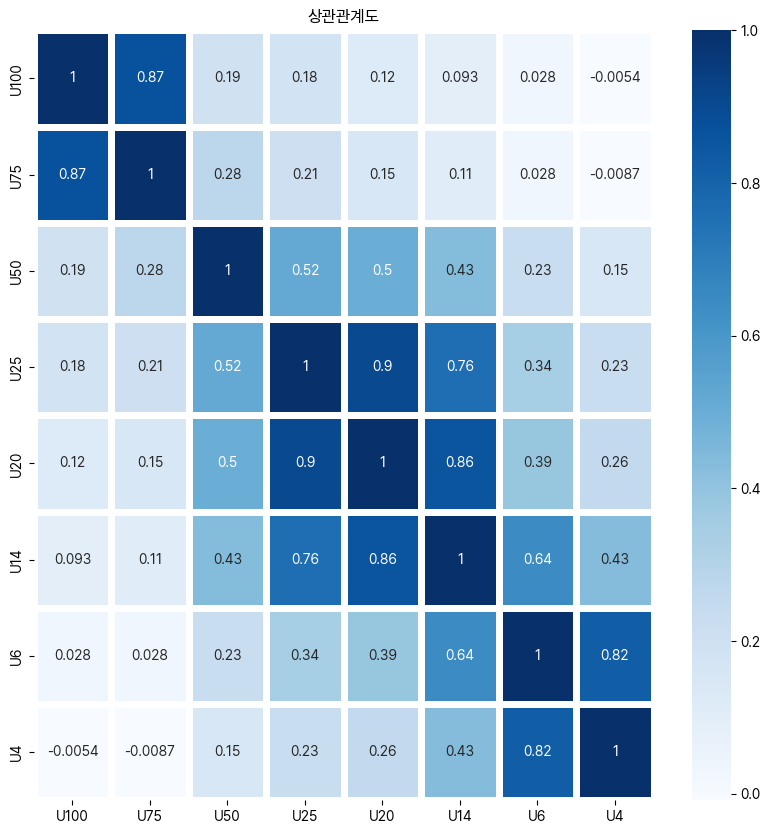

In [3]:
plt.figure(figsize=(10,10))
sns.heatmap(train_COMPONENT2[['U100','U75','U50','U25','U20','U14','U6','U4']].corr(), 
            cmap='Blues',  # 색 지정
            annot=True,  # 값 표시
            linewidth = 5
            )
plt.title('상관관계도')
plt.show()

<Figure size 1000x1000 with 0 Axes>

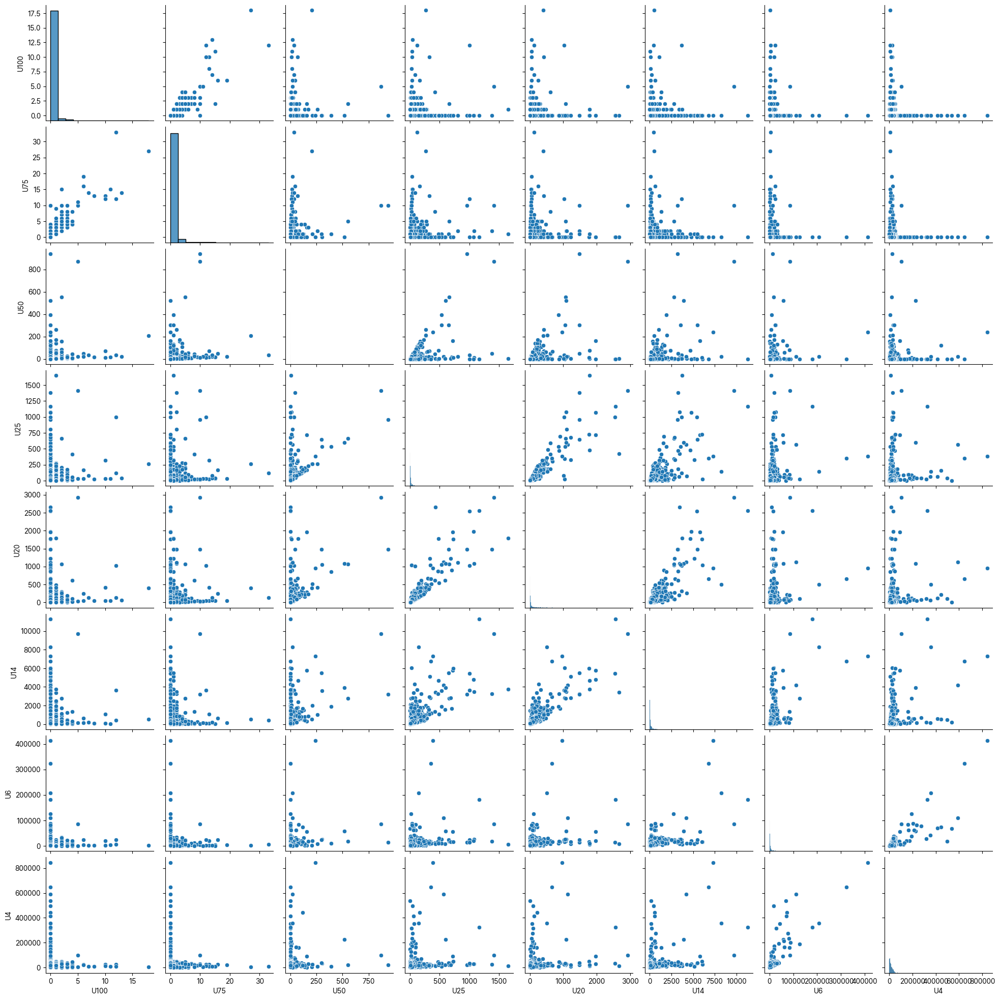

In [44]:
# Pairplot
plt.figure(figsize=(10,10))
sns.pairplot(train_COMPONENT2[['U100','U75','U50','U25','U20','U14','U6','U4']])
plt.show()

B집단 변수들의 상관관계도 - B집단은 컴포넌트1에만 있음

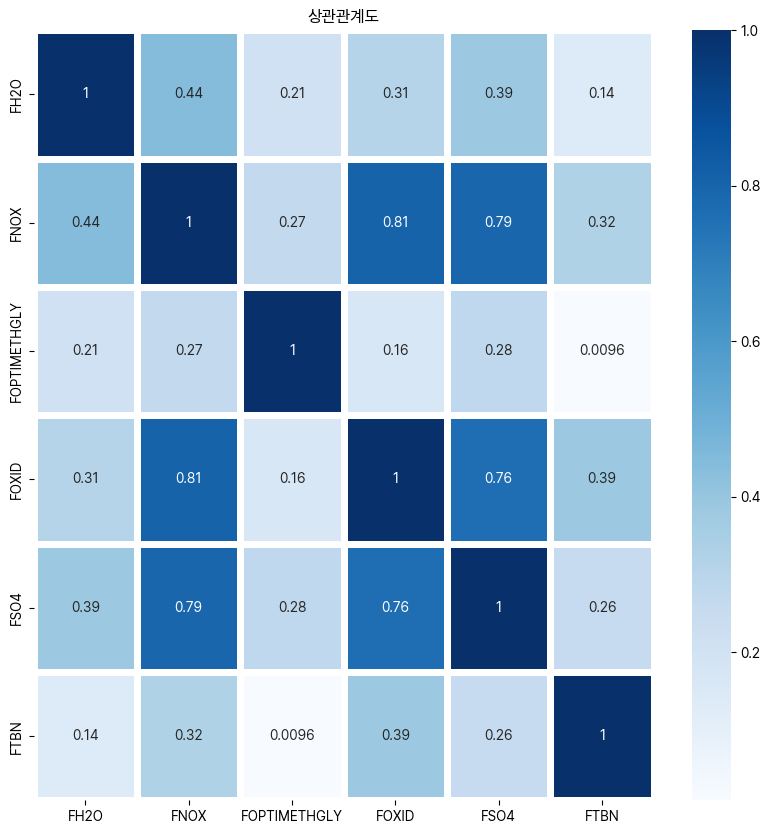

In [36]:
plt.figure(figsize=(10,10))
sns.heatmap(train_COMPONENT1[['FH2O','FNOX','FOPTIMETHGLY','FOXID','FSO4','FTBN']].corr(), 
            cmap='Blues',  # 색 지정
            annot=True,  # 값 표시
            linewidth = 5
            )
plt.title('상관관계도')
plt.show()

<Figure size 1000x1000 with 0 Axes>

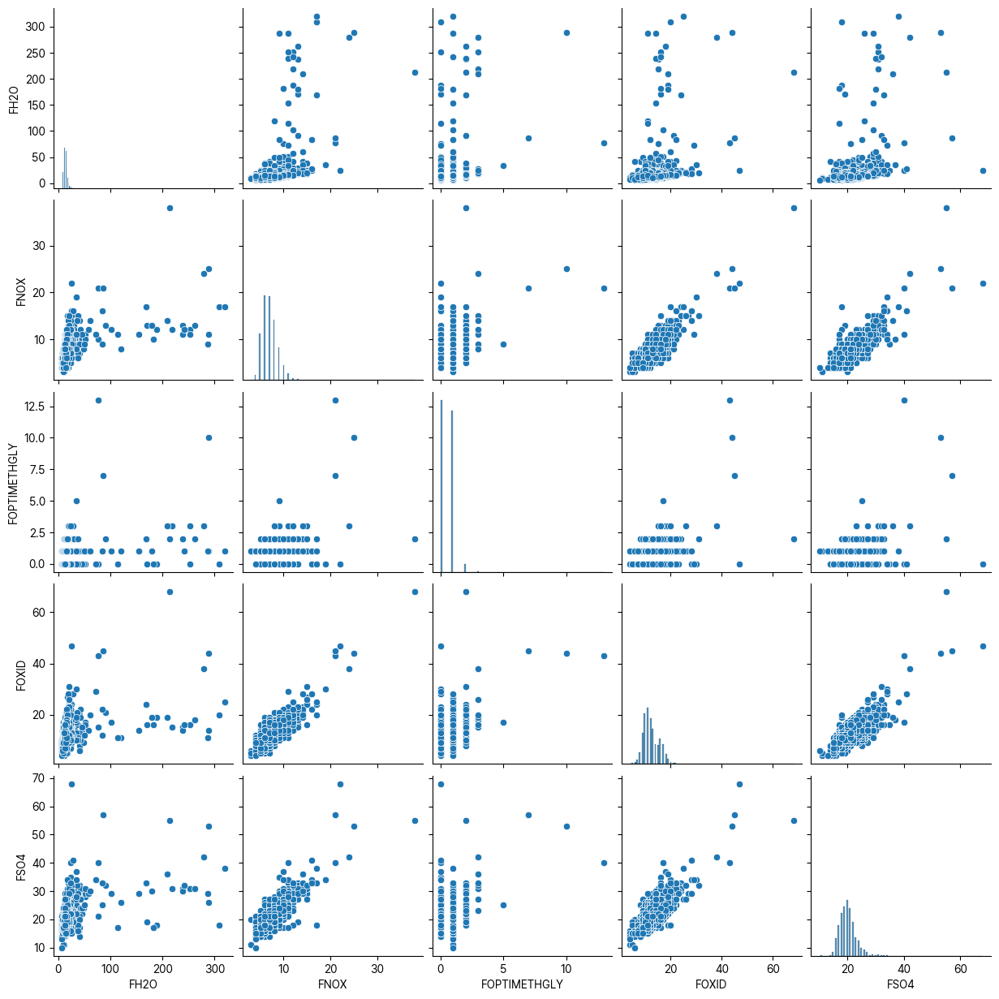

In [38]:
# Pairplot
plt.figure(figsize=(10,10))
sns.pairplot(train_COMPONENT1[['FH2O','FNOX','FOPTIMETHGLY','FOXID','FSO4']])
plt.show()

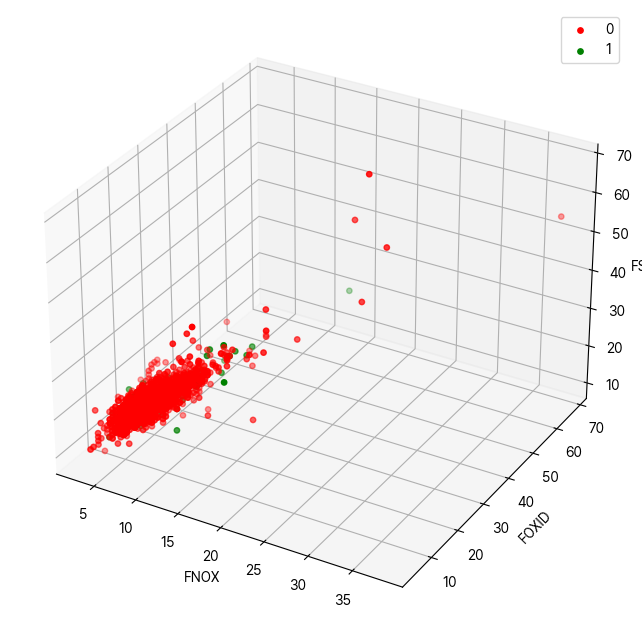

In [43]:
# 3D로 FNOX, FOXID, FSO4 관계 확인(오일 정상, 이상별)
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='3d')

ax.scatter(train_COMPONENT1[train_COMPONENT1.Y_LABEL == 0].FNOX, train_COMPONENT1[train_COMPONENT1.Y_LABEL == 0].FOXID, train_COMPONENT1[train_COMPONENT1.Y_LABEL == 0].FSO4, 
           marker='o', s=15, color='red', label='0')
ax.scatter(train_COMPONENT1[train_COMPONENT1.Y_LABEL == 1].FNOX, train_COMPONENT1[train_COMPONENT1.Y_LABEL == 1].FOXID, train_COMPONENT1[train_COMPONENT1.Y_LABEL == 1].FSO4, 
           marker='o', s=15, color='green', label='1')

ax.set_xlabel('FNOX')
ax.set_ylabel('FOXID')
ax.set_zlabel('FSO4')

plt.legend()
plt.show()

### 😎 SMOTE 돌리기

데이터 누수를 문제를 해결했다.

#### 데이터 불러오기

In [3]:
train_COMPONENT1 = pd.read_csv("train_COMPONENT1.csv")
train_COMPONENT2 = pd.read_csv("train_COMPONENT2.csv")
train_COMPONENT3 = pd.read_csv("train_COMPONENT3.csv")
train_COMPONENT4 = pd.read_csv("train_COMPONENT4.csv")

In [4]:
# 결측값 비율 계산
missing_ratio1 = train_COMPONENT1.isnull().mean()
missing_ratio2 = train_COMPONENT2.isnull().mean()
missing_ratio3 = train_COMPONENT3.isnull().mean()
missing_ratio4 = train_COMPONENT4.isnull().mean()

# 결측치 비율이 50% 이상인 변수 식별
columns_to_drop1 = missing_ratio1[missing_ratio1 >= 0.3].index.tolist()
columns_to_drop2 = missing_ratio2[missing_ratio2 >= 0.3].index.tolist()
columns_to_drop3 = missing_ratio3[missing_ratio3 >= 0.3].index.tolist()
columns_to_drop4 = missing_ratio4[missing_ratio4 >= 0.3].index.tolist()

# 해당 변수들을 데이터프레임에서 삭제
train_COMPONENT1 = train_COMPONENT1.drop(columns=columns_to_drop1)
train_COMPONENT2 = train_COMPONENT2.drop(columns=columns_to_drop2)
train_COMPONENT3 = train_COMPONENT3.drop(columns=columns_to_drop3)
train_COMPONENT4 = train_COMPONENT4.drop(columns=columns_to_drop4)

In [5]:
train_COMPONENT1 = train_COMPONENT1.dropna(subset=train_COMPONENT1.columns[train_COMPONENT1.isnull().any()])
train_COMPONENT2 = train_COMPONENT2.dropna(subset=train_COMPONENT2.columns[train_COMPONENT2.isnull().any()])
train_COMPONENT3 = train_COMPONENT3.dropna(subset=train_COMPONENT3.columns[train_COMPONENT3.isnull().any()])
train_COMPONENT4 = train_COMPONENT4.dropna(subset=train_COMPONENT4.columns[train_COMPONENT4.isnull().any()])

함수 선언

In [6]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split

## 1. 전처리 함수 (앞으로 계속 로직이 추가될 예정)
def clean_data(df):
    df_copy = df.copy()
    df_copy = df_copy.drop(columns=['ID', 'COMPONENT_ARBITRARY'])
    return df_copy

## 2. 데이터 분리 함수
def get_train_test_dataset(df):
    # 인자로 입력된 DataFrame의 사전 데이터 가공이 완료된 복사 DataFrame 반환
    df_copy = clean_data(df)
    # DataFrame의 맨 마지막 컬럼이 종속변수, 나머지는 독립변수
    X_features = df_copy.iloc[:, :-1]
    y_target = df_copy.iloc[:, -1]

    ## train_test_split()으로 학습과 테스트 데이터 분할.
    ## stratify=y_target으로 Stratified 기반 분할.
    X_train, X_test, y_train, y_test = train_test_split(X_features, 
                                                        y_target,
                                                        test_size=0.3,
                                                        random_state=0
                                                        # stratify=y_target # Stratified 기법
                                                        )
    return X_train, X_test, y_train, y_test

## 3. 모델성능 평가 함수
def get_clf_eval(y_test, pred=None, pred_proba=None):
    accuracy = accuracy_score(y_test , pred)
    precision = precision_score(y_test , pred)
    recall = recall_score(y_test , pred)
    f1 = f1_score(y_test,pred)
    f1_macro = f1_score(y_test, pred, average='macro')

    print('정확도: {0:.4f}, 정밀도: {1:.4f}, 재현율: {2:.4f}, F1: {3:.4f}, 매크로 F1: {4:.4f}'.format(accuracy, precision, recall, f1, f1_macro))

## 4. 모델 학습 및 평가 함수
def get_model_train_eval(model, X_feature_train=None, X_feature_test=None, Y_feature_train=None, Y_feature_test=None):
    model.fit(X_feature_train, Y_feature_train)
    pred = model.predict(X_feature_test)
    pred_proba = model.predict_proba(X_feature_test)[:, 1]
    get_clf_eval(Y_feature_test, pred, pred_proba)

#### 컴포넌트1의 모델 결과

In [10]:
X_train, X_test, y_train, y_test = get_train_test_dataset(train_COMPONENT1)

스모트 적용 전

In [11]:
from sklearn.ensemble import ExtraTreesClassifier
import joblib

# ExtraTreesClassifier 모델 초기화
et_clf = ExtraTreesClassifier(n_estimators=1000,
                              n_jobs=-1, 
                              random_state=42
                              )

get_model_train_eval(et_clf, X_feature_train=X_train, X_feature_test=X_test, Y_feature_train=y_train, Y_feature_test=y_test)

# model_filename = 'extra_trees_classifier_model_1.pkl'
# joblib.dump(et_clf, model_filename)

정확도: 0.9600, 정밀도: 0.8929, 재현율: 0.4386, F1: 0.5882, 매크로 F1: 0.7836


In [12]:
from imblearn.over_sampling import SMOTE

## 1. SMOTE 정의
smote = SMOTE(random_state=0)
## 2. SMOTE 적용
X_train_over, y_train_over = smote.fit_resample(X_train, y_train)

In [13]:
from sklearn.ensemble import ExtraTreesClassifier
import joblib

# ExtraTreesClassifier 모델 초기화
et_clf = ExtraTreesClassifier(n_estimators=1000,
                              n_jobs=-1, 
                              random_state=42
                              )

get_model_train_eval(et_clf, X_feature_train=X_train_over, X_feature_test=X_test, Y_feature_train=y_train_over, Y_feature_test=y_test)

# model_filename = 'extra_trees_classifier_model_1.pkl'
# joblib.dump(et_clf, model_filename)

정확도: 0.9646, 정밀도: 0.9333, 재현율: 0.4912, F1: 0.6437, 매크로 F1: 0.8125


> 👌 인사이트) f1스코어가 0.5882에서 0.6437로 늘어났다! -> 컴포넌트1은 스모트를 돌리는 것이 더 좋다.

#### 컴포넌트2의 모델 결과

In [14]:
X_train, X_test, y_train, y_test = get_train_test_dataset(train_COMPONENT2)

스모트 적용 전

In [15]:
from sklearn.ensemble import ExtraTreesClassifier

# ExtraTreesClassifier 모델 초기화
et_clf = ExtraTreesClassifier(n_estimators=1000,
                              n_jobs=-1, 
                              random_state=42
                              )

get_model_train_eval(et_clf, X_feature_train=X_train, X_feature_test=X_test, Y_feature_train=y_train, Y_feature_test=y_test)

# model_filename = 'extra_trees_classifier_model_2.pkl'
# joblib.dump(et_clf, model_filename)

정확도: 0.9382, 정밀도: 1.0000, 재현율: 0.4107, F1: 0.5823, 매크로 F1: 0.7745


스모트 적용 후

In [16]:
from imblearn.over_sampling import SMOTE

## 1. SMOTE 정의
smote = SMOTE(random_state=0)
## 2. SMOTE 적용
X_train_over, y_train_over = smote.fit_resample(X_train, y_train)

In [17]:
from sklearn.ensemble import ExtraTreesClassifier

# ExtraTreesClassifier 모델 초기화
et_clf = ExtraTreesClassifier(n_estimators=1000,
                              n_jobs=-1, 
                              random_state=42
                              )

get_model_train_eval(et_clf, X_feature_train=X_train_over, X_feature_test=X_test, Y_feature_train=y_train_over, Y_feature_test=y_test)

# model_filename = 'extra_trees_classifier_model_2.pkl'
# joblib.dump(et_clf, model_filename)

정확도: 0.9345, 정밀도: 0.9565, 재현율: 0.3929, F1: 0.5570, 매크로 F1: 0.7608


['extra_trees_classifier_model_2.pkl']

> 👌 인사이트) f1스코어가 0.5823에서 0.5570로 줄어들었다! -> 컴포넌트2은 스모트를 돌리지 않는 것이 더 좋다.

#### 컴포넌트3의 모델 결과

In [18]:
X_train, X_test, y_train, y_test = get_train_test_dataset(train_COMPONENT3)

스모트 적용 전

In [19]:
from sklearn.ensemble import ExtraTreesClassifier

# ExtraTreesClassifier 모델 초기화
et_clf = ExtraTreesClassifier(n_estimators=1000,
                              n_jobs=-1, 
                              random_state=42
                              )

get_model_train_eval(et_clf, X_feature_train=X_train, X_feature_test=X_test, Y_feature_train=y_train, Y_feature_test=y_test)

# model_filename = 'extra_trees_classifier_model_3.pkl'
# joblib.dump(et_clf, model_filename)

정확도: 0.9507, 정밀도: 1.0000, 재현율: 0.4000, F1: 0.5714, 매크로 F1: 0.7726


스모트 적용 후

In [20]:
from imblearn.over_sampling import SMOTE

## 1. SMOTE 정의
smote = SMOTE(random_state=0)
## 2. SMOTE 적용
X_train_over, y_train_over = smote.fit_resample(X_train, y_train)

In [21]:
from sklearn.ensemble import ExtraTreesClassifier

# ExtraTreesClassifier 모델 초기화
et_clf = ExtraTreesClassifier(n_estimators=1000,
                              n_jobs=-1, 
                              random_state=42
                              )

get_model_train_eval(et_clf, X_feature_train=X_train_over, X_feature_test=X_test, Y_feature_train=y_train_over, Y_feature_test=y_test)

# model_filename = 'extra_trees_classifier_model_3.pkl'
# joblib.dump(et_clf, model_filename)

정확도: 0.9514, 정밀도: 0.9048, 재현율: 0.4560, F1: 0.6064, 매크로 F1: 0.7902


> 👌 인사이트) f1스코어가 0.5714에서 0.6064로 늘어났다! -> 컴포넌트3은 스모트를 돌리는 것이 더 좋다.

#### 컴포넌트4의 모델 결과

In [22]:
X_train, X_test, y_train, y_test = get_train_test_dataset(train_COMPONENT4)

스모트 적용 전

In [24]:
from sklearn.ensemble import ExtraTreesClassifier

# ExtraTreesClassifier 모델 초기화
et_clf = ExtraTreesClassifier(n_estimators=1000,
                              n_jobs=-1, 
                              random_state=42 
                              )

get_model_train_eval(et_clf, X_feature_train=X_train, X_feature_test=X_test, Y_feature_train=y_train, Y_feature_test=y_test)

# model_filename = 'extra_trees_classifier_model_4.pkl'
# joblib.dump(et_clf, model_filename)

정확도: 0.9531, 정밀도: 0.0000, 재현율: 0.0000, F1: 0.0000, 매크로 F1: 0.4880


c:\pythonworkspace\projects\4th_project\venv\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [35]:
from imblearn.over_sampling import SMOTE

## 1. SMOTE 정의
smote = SMOTE(random_state=0)
## 2. SMOTE 적용
X_train_over, y_train_over = smote.fit_resample(X_train, y_train)

In [36]:
from sklearn.ensemble import ExtraTreesClassifier

# ExtraTreesClassifier 모델 초기화
et_clf = ExtraTreesClassifier(n_estimators=1000,
                              n_jobs=-1, 
                              random_state=42
                              )

get_model_train_eval(et_clf, X_feature_train=X_train_over, X_feature_test=X_test, Y_feature_train=y_train_over, Y_feature_test=y_test)

model_filename = 'extra_trees_classifier_model_4.pkl'
joblib.dump(et_clf, model_filename)

정확도: 0.9323, 정밀도: 0.0000, 재현율: 0.0000, F1: 0.0000, 매크로 F1: 0.4825


['extra_trees_classifier_model_4.pkl']

### 😎 AutoML 돌리기

In [177]:
from pycaret.classification import *
from sklearn.preprocessing import *
from sklearn.metrics import f1_score, make_scorer

In [178]:
# macro F1 스코어 설정
macro_f1 = make_scorer(f1_score, average='macro')

In [179]:
# PyCaret 설정
setup_clf = setup(data=train_resampled,
                  target=target_column,
                  train_size=0.7,
                  ignore_features=['ID', 'COMPONENT_ARBITRARY'],
                  normalize=True,
                  normalize_method='zscore',
                  n_jobs=-1,
                  session_id=42)

,Description,Value
0,Session id,42
1,Target,Y_LABEL
2,Target type,Binary
3,Original data shape,"(2592, 43)"
4,Transformed data shape,"(2592, 43)"
5,Transformed train set shape,"(1814, 43)"
6,Transformed test set shape,"(778, 43)"
7,Ignore features,2
8,Numeric features,42
9,Preprocess,True


In [180]:
# macro F1 스코어 추가
add_metric('macro_f1', 'Macro F1', f1_score, average='macro')

Name                                                          Macro F1
Display Name                                                  Macro F1
Score Function       <pycaret.internal.metrics.EncodedDecodedLabels...
Scorer                make_scorer(f1_score, response_method='predict')
Target                                                            pred
Args                                              {'average': 'macro'}
Greater is Better                                                 True
Multiclass                                                        True
Custom                                                            True
Name: macro_f1, dtype: object

In [181]:
# 모델 비교
best = compare_models()

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,13:20:21
Status,. . . . . . . . . . . . . . . . . .,Loading Dependencies
Estimator,. . . . . . . . . . . . . . . . . .,Compiling Library


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Macro F1,TT (Sec)
et,Extra Trees Classifier,0.9763,0.9981,0.9758,0.9770,0.9763,0.9526,0.9528,0.9763,0.0470
lightgbm,Light Gradient Boosting Machine,0.9724,0.9960,0.9658,0.9791,0.9722,0.9449,0.9453,0.9722,0.1880
xgboost,Extreme Gradient Boosting,0.9691,0.9961,0.9669,0.9713,0.9690,0.9382,0.9385,0.9690,0.0550
rf,Random Forest Classifier,0.9675,0.9959,0.9548,0.9797,0.9670,0.9349,0.9354,0.9670,0.0570
gbc,Gradient Boosting Classifier,0.9471,0.9904,0.9272,0.9658,0.9459,0.8941,0.8952,0.9459,0.1210
ada,Ada Boost Classifier,0.9256,0.9806,0.9085,0.9411,0.9243,0.8511,0.8519,0.9243,0.0410
dt,Decision Tree Classifier,0.9013,0.9013,0.9162,0.8911,0.9027,0.8026,0.8043,0.9027,0.0100
lr,Logistic Regression,0.8672,0.9456,0.8335,0.8939,0.8624,0.7343,0.7364,0.8624,1.8240
svm,SVM - Linear Kernel,0.8490,0.9232,0.8259,0.8668,0.8445,0.6980,0.7008,0.8445,0.0090
knn,K Neighbors Classifier,0.8435,0.9373,0.9812,0.7703,0.8627,0.6869,0.7152,0.8627,0.1880


### 😎 피쳐 임포턴스 시각화

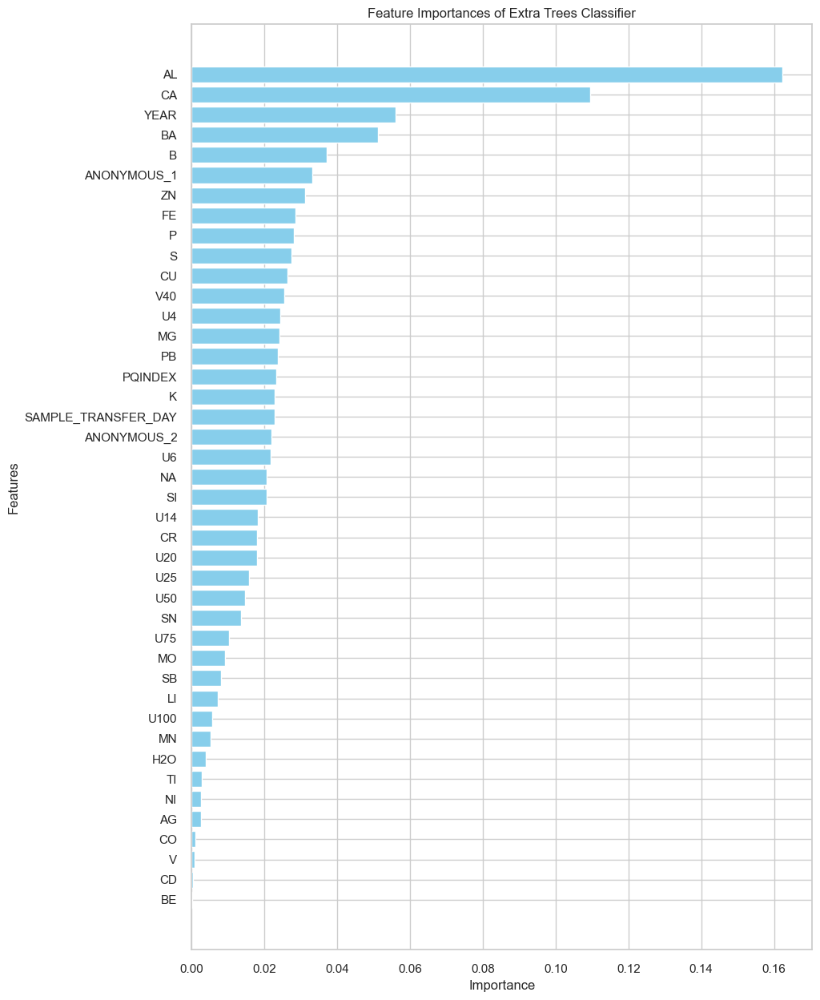

In [182]:
# Feature importance 추출
importance_df = pd.DataFrame({
    'Feature': get_config('X_train').columns,
    'Importance': best.feature_importances_
}).sort_values(by='Importance', ascending=False)

# Feature importance 시각화
plt.figure(figsize=(10, 15))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Feature Importances of Extra Trees Classifier')
plt.gca().invert_yaxis()
plt.show()

### 😎 Shaply 적용

In [183]:
import xgboost as xgb

In [184]:
# XGBoost 모델 정의 및 학습
model = xgb.XGBClassifier()
model.fit(X_resampled, y_resampled)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='binary:logistic', ...)

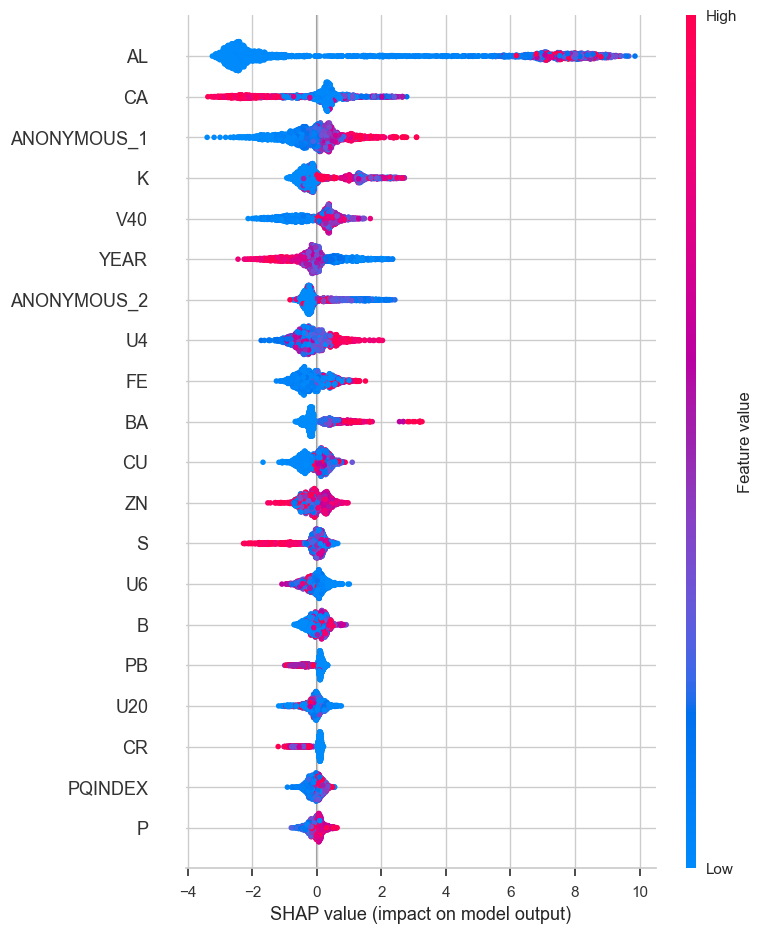

In [185]:
import shap

shap.initjs()
explainer = shap.TreeExplainer(model) ## 모델을 shap에 입력
shap_values = explainer.shap_values(X_resampled) ## shap value 계산

## summary_plot은 모든 변수의 섀플리 값을 보여준다.
shap.summary_plot(shap_values, X_resampled)

### 😎 각 컴포넌트 별로 K값의 크기 확인

In [1]:
import pandas as pd

In [2]:
train_COMPONENT1 = pd.read_csv("train_COMPONENT1.csv")
train_COMPONENT2 = pd.read_csv("train_COMPONENT2.csv")
train_COMPONENT3 = pd.read_csv("train_COMPONENT3.csv")
train_COMPONENT4 = pd.read_csv("train_COMPONENT4.csv")

In [3]:
# 'K' 열 추출
k_component1 = train_COMPONENT1['K']
k_component2 = train_COMPONENT2['K']
k_component3 = train_COMPONENT3['K']
k_component4 = train_COMPONENT4['K']

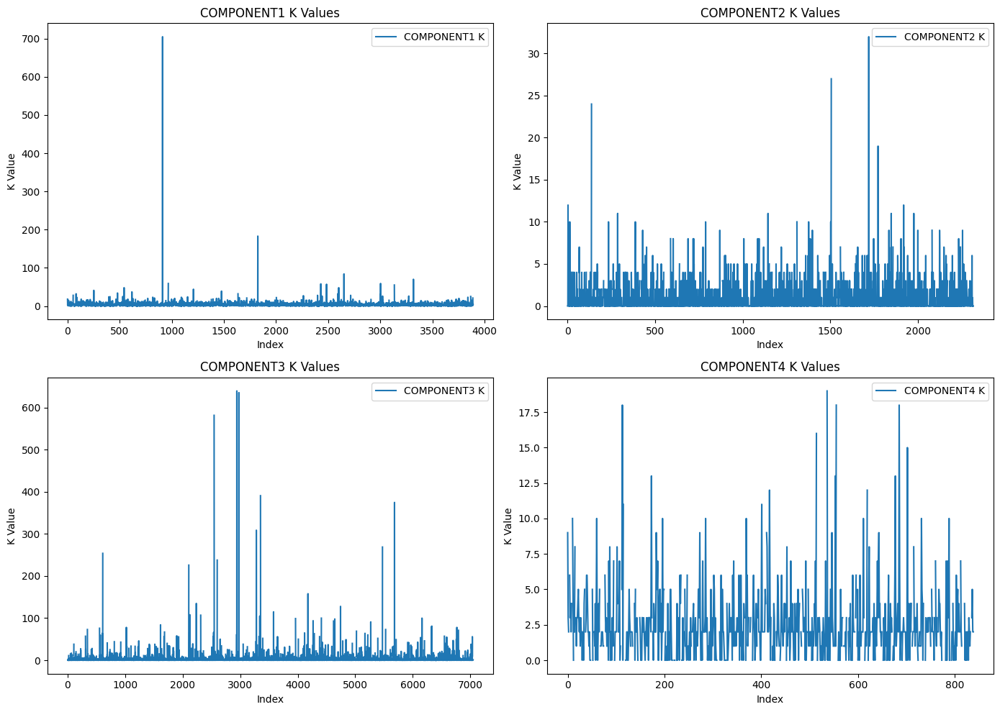

In [6]:
# 시각화
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# Component 1
axs[0, 0].plot(k_component1, label='COMPONENT1 K')
axs[0, 0].set_title('COMPONENT1 K Values')
axs[0, 0].set_xlabel('Index')
axs[0, 0].set_ylabel('K Value')
axs[0, 0].legend()

# Component 2
axs[0, 1].plot(k_component2, label='COMPONENT2 K')
axs[0, 1].set_title('COMPONENT2 K Values')
axs[0, 1].set_xlabel('Index')
axs[0, 1].set_ylabel('K Value')
axs[0, 1].legend()

# Component 3
axs[1, 0].plot(k_component3, label='COMPONENT3 K')
axs[1, 0].set_title('COMPONENT3 K Values')
axs[1, 0].set_xlabel('Index')
axs[1, 0].set_ylabel('K Value')
axs[1, 0].legend()

# Component 4
axs[1, 1].plot(k_component4, label='COMPONENT4 K')
axs[1, 1].set_title('COMPONENT4 K Values')
axs[1, 1].set_xlabel('Index')
axs[1, 1].set_ylabel('K Value')
axs[1, 1].legend()

plt.tight_layout()
plt.show()

히스토그램

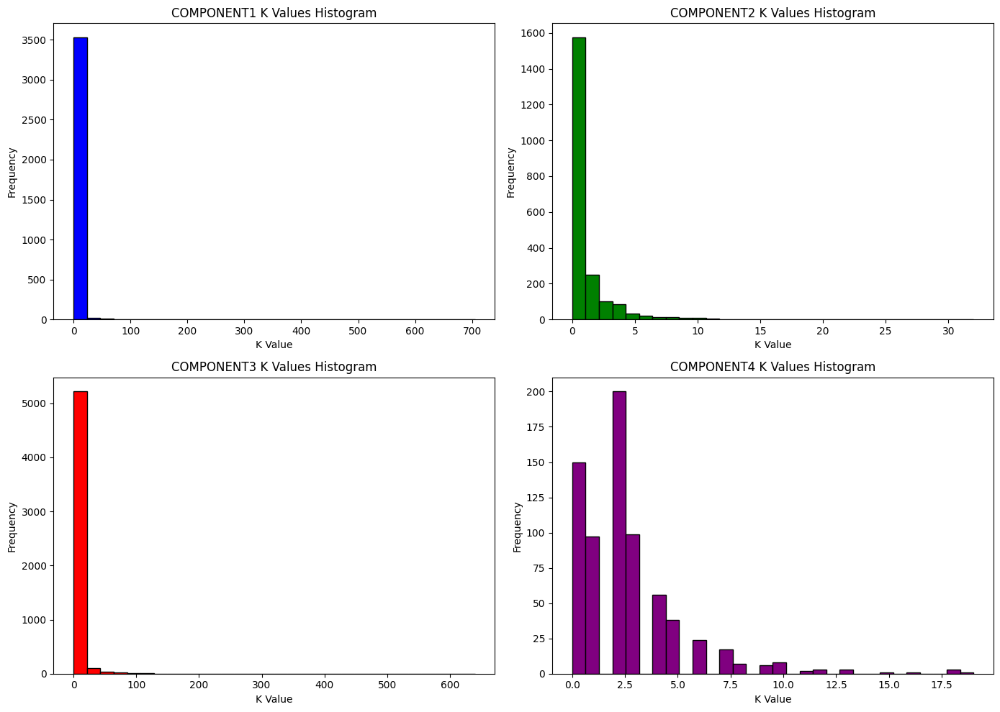

In [7]:
# 'K' 열 추출
k_component1 = train_COMPONENT1['K']
k_component2 = train_COMPONENT2['K']
k_component3 = train_COMPONENT3['K']
k_component4 = train_COMPONENT4['K']

# 시각화
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# Component 1
axs[0, 0].hist(k_component1, bins=30, color='blue', edgecolor='black')
axs[0, 0].set_title('COMPONENT1 K Values Histogram')
axs[0, 0].set_xlabel('K Value')
axs[0, 0].set_ylabel('Frequency')

# Component 2
axs[0, 1].hist(k_component2, bins=30, color='green', edgecolor='black')
axs[0, 1].set_title('COMPONENT2 K Values Histogram')
axs[0, 1].set_xlabel('K Value')
axs[0, 1].set_ylabel('Frequency')

# Component 3
axs[1, 0].hist(k_component3, bins=30, color='red', edgecolor='black')
axs[1, 0].set_title('COMPONENT3 K Values Histogram')
axs[1, 0].set_xlabel('K Value')
axs[1, 0].set_ylabel('Frequency')

# Component 4
axs[1, 1].hist(k_component4, bins=30, color='purple', edgecolor='black')
axs[1, 1].set_title('COMPONENT4 K Values Histogram')
axs[1, 1].set_xlabel('K Value')
axs[1, 1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

### 😎 각 컴포넌트별로 PQINDEX 비교해보기

#### 🧐 결측치 처리 전

In [3]:
train_COMPONENT1 = pd.read_csv("train_COMPONENT1.csv")
train_COMPONENT2 = pd.read_csv("train_COMPONENT2.csv")
train_COMPONENT3 = pd.read_csv("train_COMPONENT3.csv")
train_COMPONENT4 = pd.read_csv("train_COMPONENT4.csv")

In [4]:
pqindex_component1 = train_COMPONENT1['PQINDEX']
pqindex_component2 = train_COMPONENT2['PQINDEX']
pqindex_component3 = train_COMPONENT3['PQINDEX']
pqindex_component4 = train_COMPONENT4['PQINDEX']

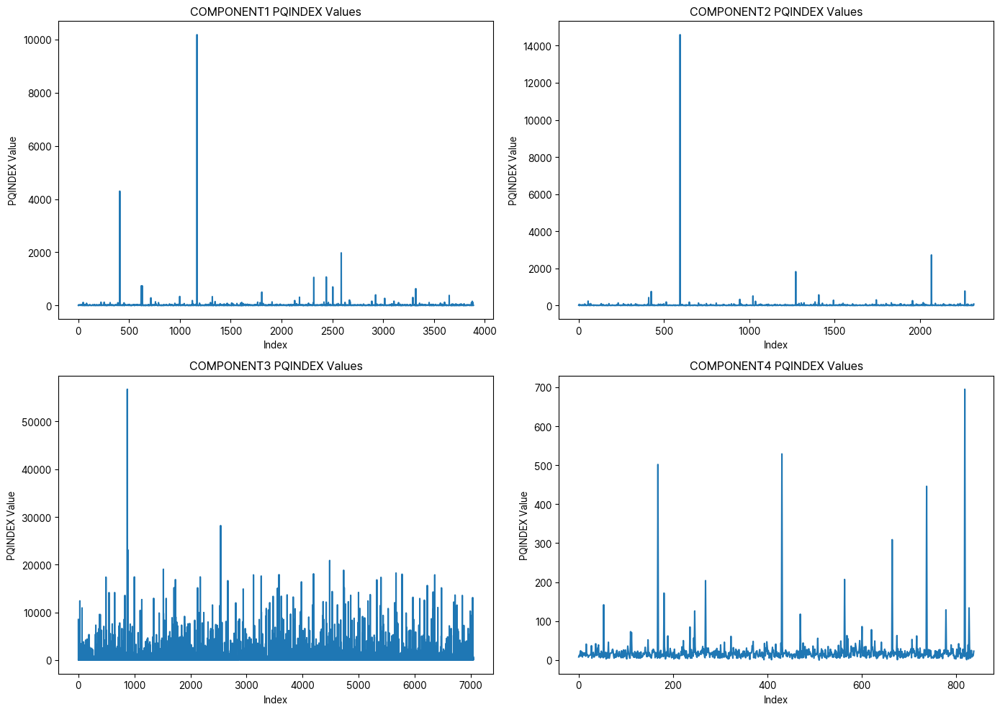

In [5]:
# 시각화
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# Component 1
axs[0, 0].plot(pqindex_component1, label='COMPONENT1 PQINDEX')
axs[0, 0].set_title('COMPONENT1 PQINDEX Values')
axs[0, 0].set_xlabel('Index')
axs[0, 0].set_ylabel('PQINDEX Value')

# Component 2
axs[0, 1].plot(pqindex_component2, label='COMPONENT2 PQINDEX')
axs[0, 1].set_title('COMPONENT2 PQINDEX Values')
axs[0, 1].set_xlabel('Index')
axs[0, 1].set_ylabel('PQINDEX Value')

# Component 3
axs[1, 0].plot(pqindex_component3, label='COMPONENT3 PQINDEX')
axs[1, 0].set_title('COMPONENT3 PQINDEX Values')
axs[1, 0].set_xlabel('Index')
axs[1, 0].set_ylabel('PQINDEX Value')

# Component 4
axs[1, 1].plot(pqindex_component4, label='COMPONENT4 PQINDEX')
axs[1, 1].set_title('COMPONENT4 PQINDEX Values')
axs[1, 1].set_xlabel('Index')
axs[1, 1].set_ylabel('PQINDEX Value')

plt.tight_layout()
plt.show()

#### 🧐 결측치 처리 후

In [6]:
train_COMPONENT1 = pd.read_csv("train_COMPONENT1.csv")
train_COMPONENT2 = pd.read_csv("train_COMPONENT2.csv")
train_COMPONENT3 = pd.read_csv("train_COMPONENT3.csv")
train_COMPONENT4 = pd.read_csv("train_COMPONENT4.csv")

In [7]:
# 결측값 비율 계산
missing_ratio1 = train_COMPONENT1.isnull().mean()
missing_ratio2 = train_COMPONENT2.isnull().mean()
missing_ratio3 = train_COMPONENT3.isnull().mean()
missing_ratio4 = train_COMPONENT4.isnull().mean()

# 결측치 비율이 50% 이상인 변수 식별
columns_to_drop1 = missing_ratio1[missing_ratio1 >= 0.3].index.tolist()
columns_to_drop2 = missing_ratio2[missing_ratio2 >= 0.3].index.tolist()
columns_to_drop3 = missing_ratio3[missing_ratio3 >= 0.3].index.tolist()
columns_to_drop4 = missing_ratio4[missing_ratio4 >= 0.3].index.tolist()

# 해당 변수들을 데이터프레임에서 삭제
train_COMPONENT1 = train_COMPONENT1.drop(columns=columns_to_drop1)
train_COMPONENT2 = train_COMPONENT2.drop(columns=columns_to_drop2)
train_COMPONENT3 = train_COMPONENT3.drop(columns=columns_to_drop3)
train_COMPONENT4 = train_COMPONENT4.drop(columns=columns_to_drop4)

In [8]:
train_COMPONENT1 = train_COMPONENT1.dropna(subset=train_COMPONENT1.columns[train_COMPONENT1.isnull().any()])
train_COMPONENT2 = train_COMPONENT2.dropna(subset=train_COMPONENT2.columns[train_COMPONENT2.isnull().any()])
train_COMPONENT3 = train_COMPONENT3.dropna(subset=train_COMPONENT3.columns[train_COMPONENT3.isnull().any()])
train_COMPONENT4 = train_COMPONENT4.dropna(subset=train_COMPONENT4.columns[train_COMPONENT4.isnull().any()])

In [9]:
pqindex_component1 = train_COMPONENT1['PQINDEX']
pqindex_component2 = train_COMPONENT2['PQINDEX']
pqindex_component3 = train_COMPONENT3['PQINDEX']
pqindex_component4 = train_COMPONENT4['PQINDEX']

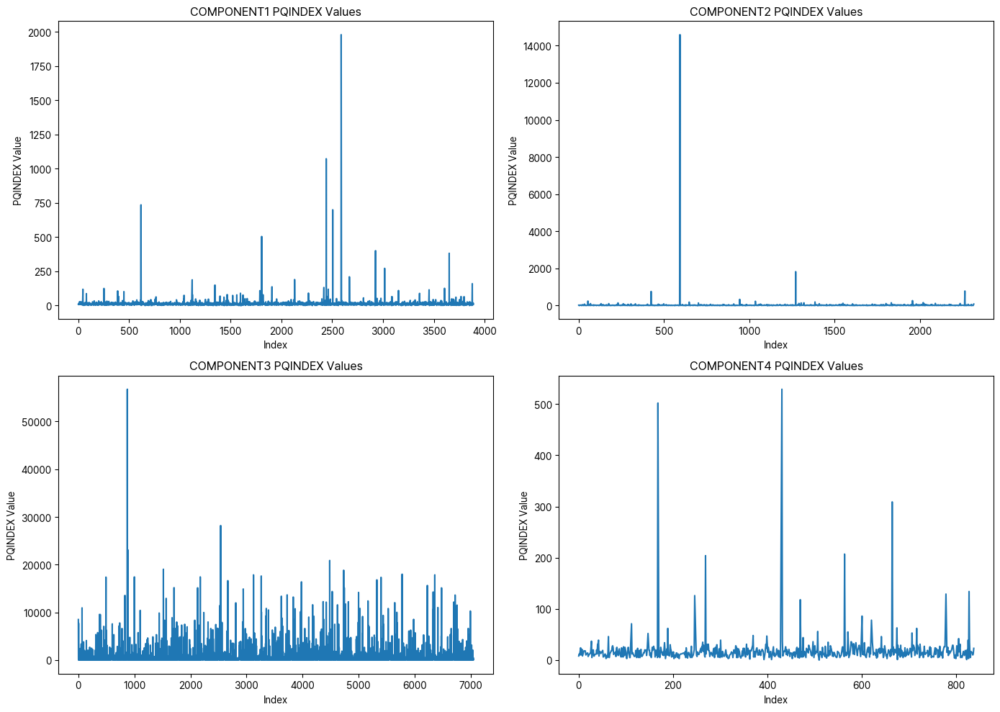

In [10]:
# 시각화
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# Component 1
axs[0, 0].plot(pqindex_component1, label='COMPONENT1 PQINDEX')
axs[0, 0].set_title('COMPONENT1 PQINDEX Values')
axs[0, 0].set_xlabel('Index')
axs[0, 0].set_ylabel('PQINDEX Value')

# Component 2
axs[0, 1].plot(pqindex_component2, label='COMPONENT2 PQINDEX')
axs[0, 1].set_title('COMPONENT2 PQINDEX Values')
axs[0, 1].set_xlabel('Index')
axs[0, 1].set_ylabel('PQINDEX Value')

# Component 3
axs[1, 0].plot(pqindex_component3, label='COMPONENT3 PQINDEX')
axs[1, 0].set_title('COMPONENT3 PQINDEX Values')
axs[1, 0].set_xlabel('Index')
axs[1, 0].set_ylabel('PQINDEX Value')

# Component 4
axs[1, 1].plot(pqindex_component4, label='COMPONENT4 PQINDEX')
axs[1, 1].set_title('COMPONENT4 PQINDEX Values')
axs[1, 1].set_xlabel('Index')
axs[1, 1].set_ylabel('PQINDEX Value')

plt.tight_layout()
plt.show()

#### 🧐  PQINDEX와 FE를 동시에 분석

1. PQ High + Fe High: 무겁고 입자수가 많다.
2. PQ High + Fe Low: 무겁고 입자수가 적다.
3. PQ Low + Fe High: 가볍고 입자수가 많다.
4. PQ Low + Fe Low: 가볍고 입자수가 적다.

In [37]:
train_COMPONENT2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1779 entries, 1 to 2315
Data columns (total 45 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   1779 non-null   object 
 1   COMPONENT_ARBITRARY  1779 non-null   object 
 2   ANONYMOUS_1          1779 non-null   int64  
 3   YEAR                 1779 non-null   int64  
 4   SAMPLE_TRANSFER_DAY  1779 non-null   int64  
 5   ANONYMOUS_2          1779 non-null   int64  
 6   AG                   1779 non-null   int64  
 7   AL                   1779 non-null   int64  
 8   B                    1779 non-null   int64  
 9   BA                   1779 non-null   int64  
 10  BE                   1779 non-null   int64  
 11  CA                   1779 non-null   int64  
 12  CD                   1779 non-null   float64
 13  CO                   1779 non-null   int64  
 14  CR                   1779 non-null   int64  
 15  CU                   1779 non-null   int64 

In [46]:
# PQINDEX 열에서 가장 큰 값을 가지는 행 찾기
max_pq_index = train_COMPONENT2['PQINDEX'].idxmax()

# 해당 행 제거
train_COMPONENT2 = train_COMPONENT2.drop(index=max_pq_index)

In [47]:
pqindex_component1 = train_COMPONENT1['PQINDEX']
pqindex_component2 = train_COMPONENT2['PQINDEX']
pqindex_component3 = train_COMPONENT3['PQINDEX']
pqindex_component4 = train_COMPONENT4['PQINDEX']

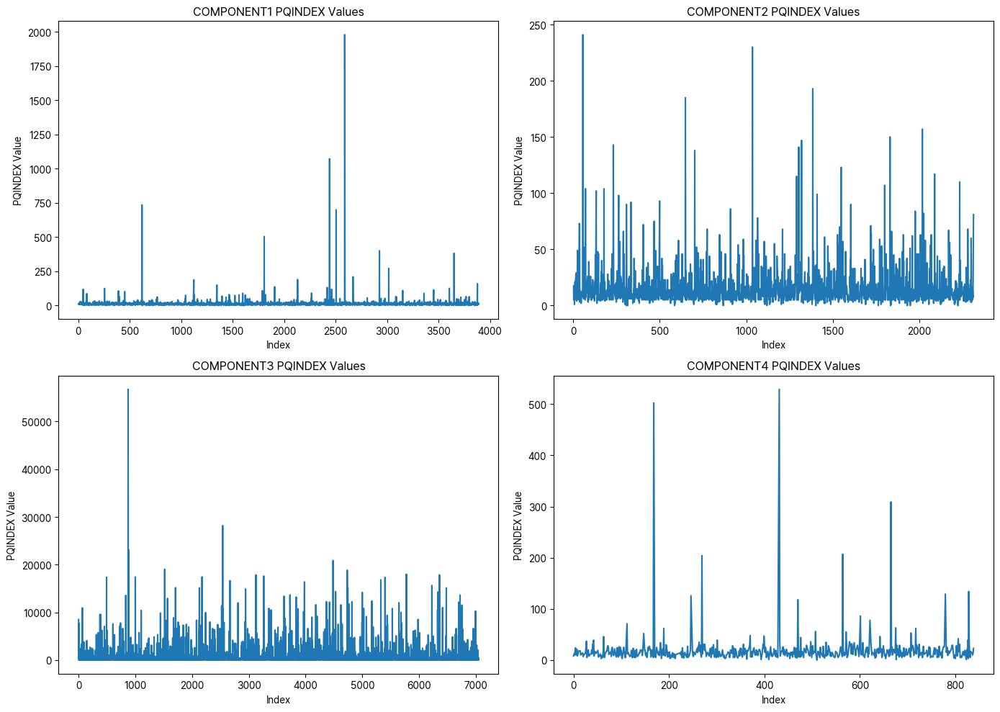

In [48]:
# 시각화
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# Component 1
axs[0, 0].plot(pqindex_component1, label='COMPONENT1 PQINDEX')
axs[0, 0].set_title('COMPONENT1 PQINDEX Values')
axs[0, 0].set_xlabel('Index')
axs[0, 0].set_ylabel('PQINDEX Value')

# Component 2
axs[0, 1].plot(pqindex_component2, label='COMPONENT2 PQINDEX')
axs[0, 1].set_title('COMPONENT2 PQINDEX Values')
axs[0, 1].set_xlabel('Index')
axs[0, 1].set_ylabel('PQINDEX Value')

# Component 3
axs[1, 0].plot(pqindex_component3, label='COMPONENT3 PQINDEX')
axs[1, 0].set_title('COMPONENT3 PQINDEX Values')
axs[1, 0].set_xlabel('Index')
axs[1, 0].set_ylabel('PQINDEX Value')

# Component 4
axs[1, 1].plot(pqindex_component4, label='COMPONENT4 PQINDEX')
axs[1, 1].set_title('COMPONENT4 PQINDEX Values')
axs[1, 1].set_xlabel('Index')
axs[1, 1].set_ylabel('PQINDEX Value')

plt.tight_layout()
plt.show()

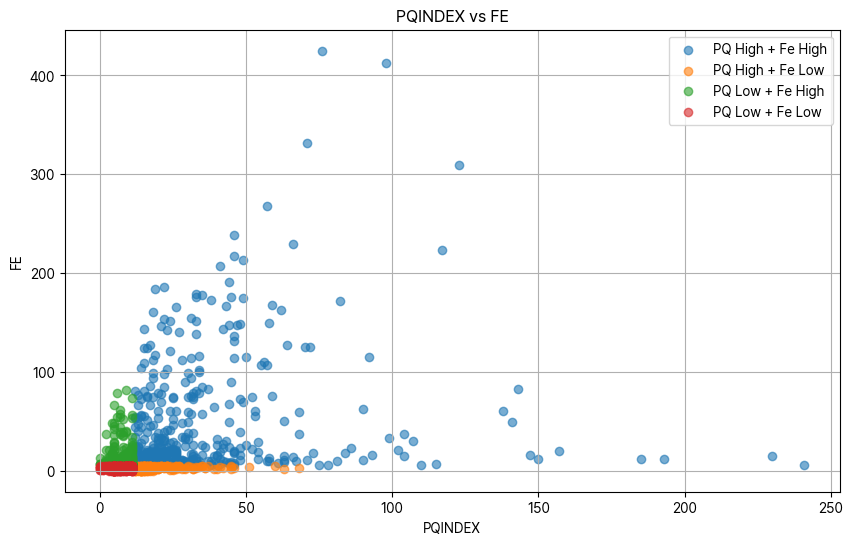

In [49]:
# 결측치는 위에서 처리함

import pandas as pd
import matplotlib.pyplot as plt

# 도메인 지식을 바탕으로 시각화할 데이터를 필터링 및 분류
high_pq_high_fe = train_COMPONENT2[(train_COMPONENT2['PQINDEX'] > train_COMPONENT2['PQINDEX'].median()) & (train_COMPONENT2['FE'] > train_COMPONENT2['FE'].median())]
high_pq_low_fe = train_COMPONENT2[(train_COMPONENT2['PQINDEX'] > train_COMPONENT2['PQINDEX'].median()) & (train_COMPONENT2['FE'] <= train_COMPONENT2['FE'].median())]
low_pq_high_fe = train_COMPONENT2[(train_COMPONENT2['PQINDEX'] <= train_COMPONENT2['PQINDEX'].median()) & (train_COMPONENT2['FE'] > train_COMPONENT2['FE'].median())]
low_pq_low_fe = train_COMPONENT2[(train_COMPONENT2['PQINDEX'] <= train_COMPONENT2['PQINDEX'].median()) & (train_COMPONENT2['FE'] <= train_COMPONENT2['FE'].median())]

# 시각화
plt.figure(figsize=(10, 6))

# 고PQ + 고Fe
plt.scatter(high_pq_high_fe['PQINDEX'], high_pq_high_fe['FE'], label='PQ High + Fe High', alpha=0.6)

# 고PQ + 저Fe
plt.scatter(high_pq_low_fe['PQINDEX'], high_pq_low_fe['FE'], label='PQ High + Fe Low', alpha=0.6)

# 저PQ + 고Fe
plt.scatter(low_pq_high_fe['PQINDEX'], low_pq_high_fe['FE'], label='PQ Low + Fe High', alpha=0.6)

# 저PQ + 저Fe
plt.scatter(low_pq_low_fe['PQINDEX'], low_pq_low_fe['FE'], label='PQ Low + Fe Low', alpha=0.6)

# 그래프 제목 및 레이블 설정
plt.title('PQINDEX vs FE')
plt.xlabel('PQINDEX')
plt.ylabel('FE')
plt.legend()
plt.grid(True)

# 그래프 출력
plt.show()


### 😎 컴포넌트2가 어떤 부품인지 예측해보기 ...

- 컴포넌트2에는 유일하게 파티클의 개수를 나타내는 변수가 포함되어 있음.
- 신유와 폐유를 구분하여 각각의 값들을 plot해보기.

In [96]:
import pandas as pd

In [97]:
train_COMPONENT2 = pd.read_csv("train_COMPONENT2.csv")

In [98]:
# 결측값 비율 계산
missing_ratio = train_COMPONENT2.isnull().mean()

# 결측값이 있는 열들의 비율 출력
print("Columns with missing values and their missing ratios:")
print(missing_ratio[missing_ratio > 0])

# 결측치 비율이 50% 이상인 변수 식별
columns_to_drop = missing_ratio[missing_ratio >= 0.5].index.tolist()

# 해당 변수들을 데이터프레임에서 삭제
train_COMPONENT2 = train_COMPONENT2.drop(columns=columns_to_drop)

Columns with missing values and their missing ratios:
CD                0.145078
FH2O              1.000000
FNOX              1.000000
FOPTIMETHGLY      1.000000
FOXID             1.000000
FSO4              1.000000
FTBN              1.000000
FUEL              1.000000
K                 0.086356
SOOTPERCENTAGE    1.000000
U14               0.085492
U6                0.085492
U4                0.085492
V100              1.000000
dtype: float64


In [99]:
train_COMPONENT2 = train_COMPONENT2.dropna(subset=train_COMPONENT2.columns[train_COMPONENT2.isnull().any()])

In [100]:
train_COMPONENT2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1779 entries, 1 to 2315
Data columns (total 45 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   1779 non-null   object 
 1   COMPONENT_ARBITRARY  1779 non-null   object 
 2   ANONYMOUS_1          1779 non-null   int64  
 3   YEAR                 1779 non-null   int64  
 4   SAMPLE_TRANSFER_DAY  1779 non-null   int64  
 5   ANONYMOUS_2          1779 non-null   int64  
 6   AG                   1779 non-null   int64  
 7   AL                   1779 non-null   int64  
 8   B                    1779 non-null   int64  
 9   BA                   1779 non-null   int64  
 10  BE                   1779 non-null   int64  
 11  CA                   1779 non-null   int64  
 12  CD                   1779 non-null   float64
 13  CO                   1779 non-null   int64  
 14  CR                   1779 non-null   int64  
 15  CU                   1779 non-null   int64 

In [101]:
# Y_LABEL 값 기준으로 데이터 쪼개기
train_COMPONENT2_new = train_COMPONENT2[train_COMPONENT2['Y_LABEL'] == 0]
train_COMPONENT2_old = train_COMPONENT2[train_COMPONENT2['Y_LABEL'] == 1]

In [102]:
# 특정 열 드랍
train_COMPONENT2_new = train_COMPONENT2_new.drop(columns=['Y_LABEL', 'ID', 'COMPONENT_ARBITRARY'])
train_COMPONENT2_old = train_COMPONENT2_old.drop(columns=['Y_LABEL', 'ID', 'COMPONENT_ARBITRARY'])

In [103]:
train_COMPONENT2_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1620 entries, 2 to 2315
Data columns (total 42 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ANONYMOUS_1          1620 non-null   int64  
 1   YEAR                 1620 non-null   int64  
 2   SAMPLE_TRANSFER_DAY  1620 non-null   int64  
 3   ANONYMOUS_2          1620 non-null   int64  
 4   AG                   1620 non-null   int64  
 5   AL                   1620 non-null   int64  
 6   B                    1620 non-null   int64  
 7   BA                   1620 non-null   int64  
 8   BE                   1620 non-null   int64  
 9   CA                   1620 non-null   int64  
 10  CD                   1620 non-null   float64
 11  CO                   1620 non-null   int64  
 12  CR                   1620 non-null   int64  
 13  CU                   1620 non-null   int64  
 14  FE                   1620 non-null   int64  
 15  H2O                  1620 non-null   float6

In [104]:
train_COMPONENT2_old.info()

<class 'pandas.core.frame.DataFrame'>
Index: 159 entries, 1 to 2309
Data columns (total 42 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ANONYMOUS_1          159 non-null    int64  
 1   YEAR                 159 non-null    int64  
 2   SAMPLE_TRANSFER_DAY  159 non-null    int64  
 3   ANONYMOUS_2          159 non-null    int64  
 4   AG                   159 non-null    int64  
 5   AL                   159 non-null    int64  
 6   B                    159 non-null    int64  
 7   BA                   159 non-null    int64  
 8   BE                   159 non-null    int64  
 9   CA                   159 non-null    int64  
 10  CD                   159 non-null    float64
 11  CO                   159 non-null    int64  
 12  CR                   159 non-null    int64  
 13  CU                   159 non-null    int64  
 14  FE                   159 non-null    int64  
 15  H2O                  159 non-null    float64

#### 🧐 컴포넌트2 신유 히스토그램

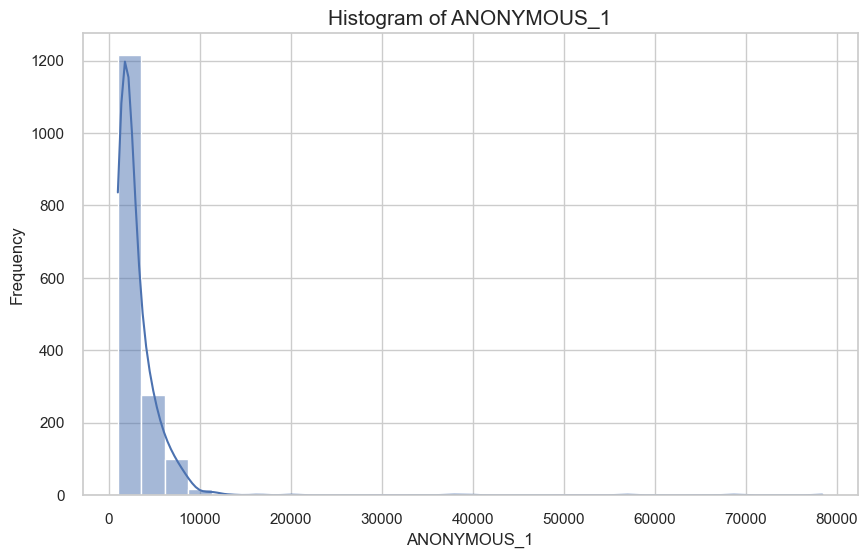

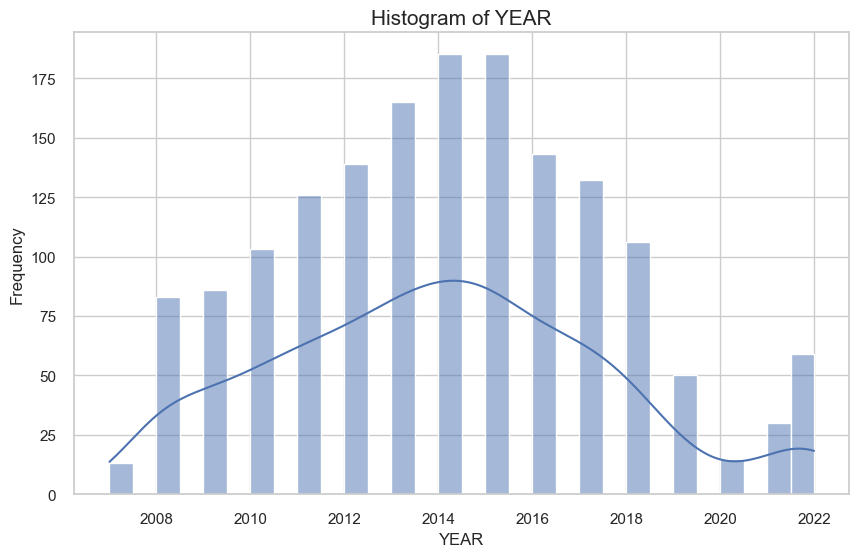

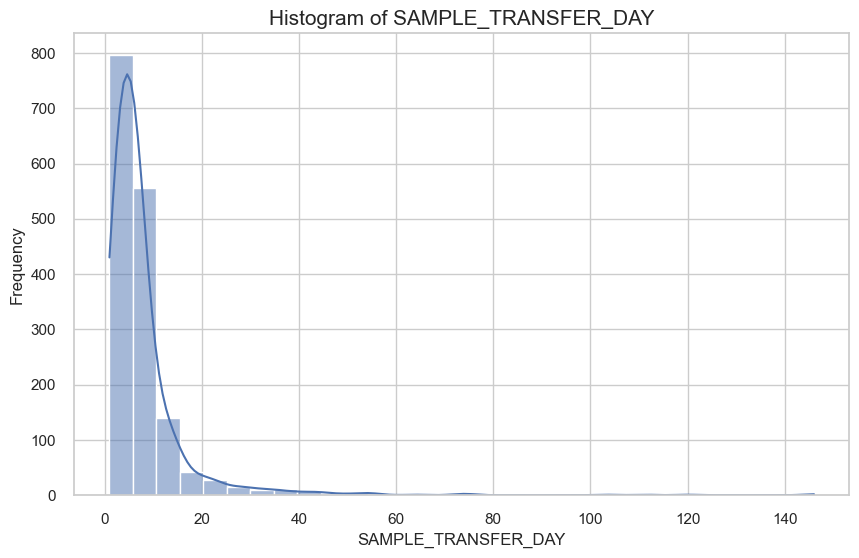

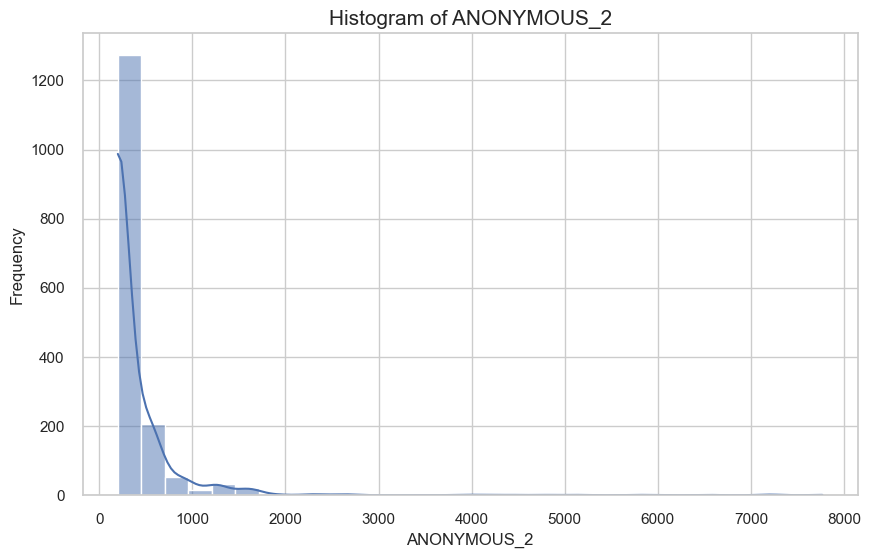

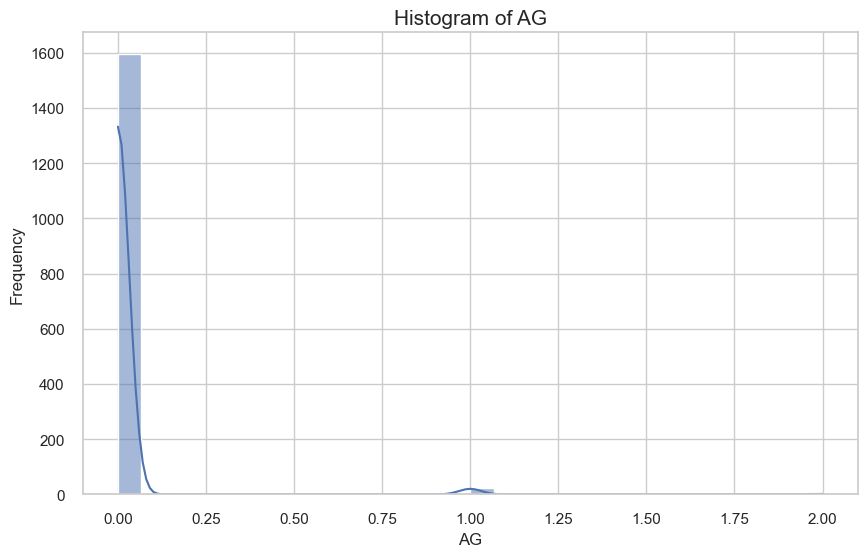

...

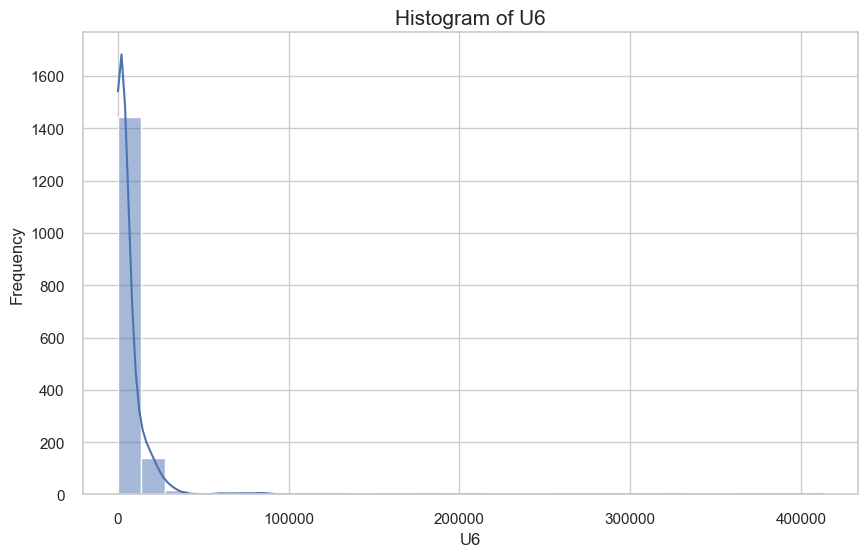

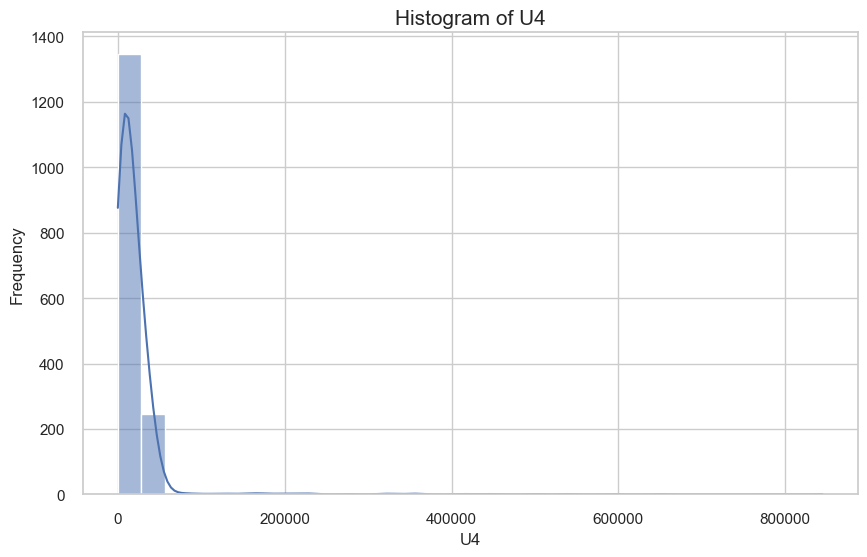

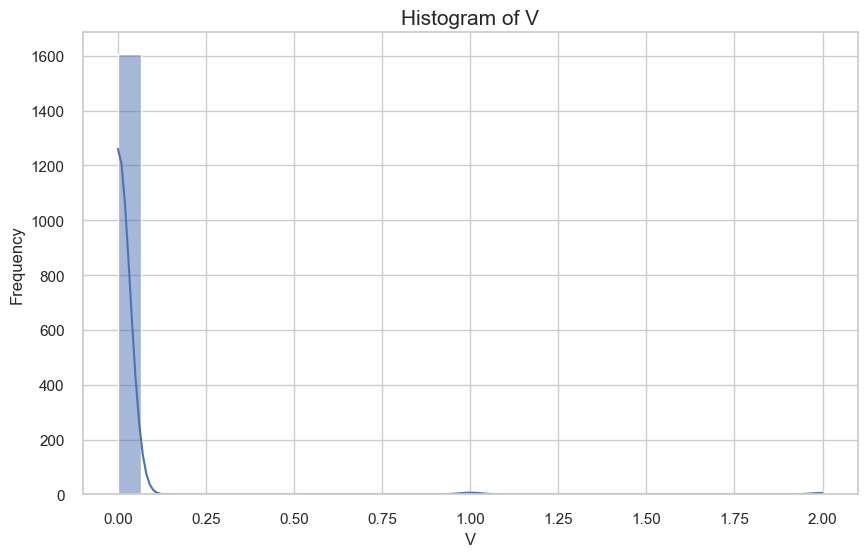

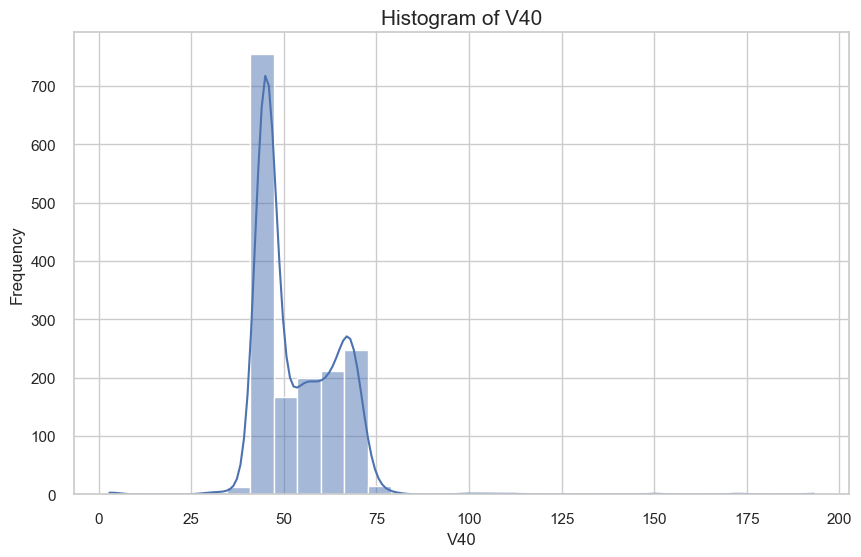

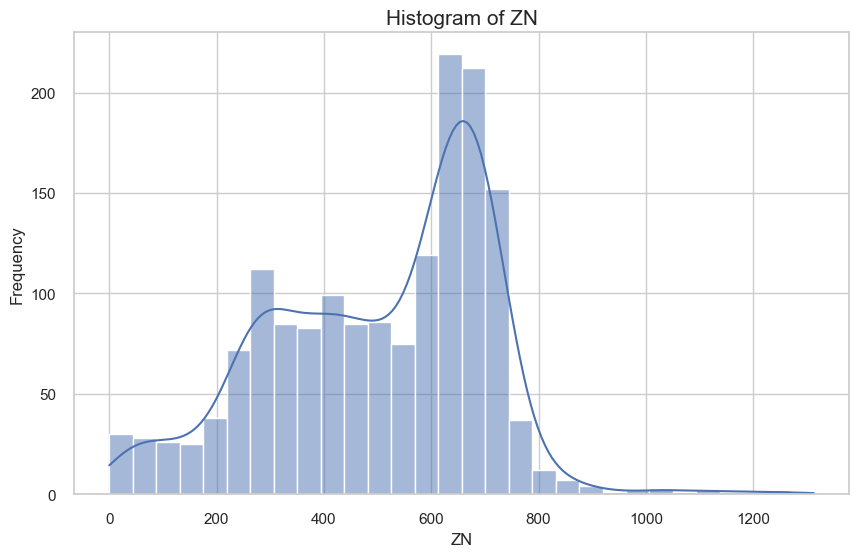

In [105]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 데이터 로드 (train_COMPONENT2_new를 이미 로드했다고 가정)
# 예: train_COMPONENT2_new = pd.read_csv('your_dataset.csv')

# 그래프 스타일 설정
sns.set(style="whitegrid")

# 각 열을 히스토그램으로 시각화
for column in train_COMPONENT2_new.columns:
    plt.figure(figsize=(10, 6))
    
    # 히스토그램 그리기
    sns.histplot(train_COMPONENT2_new[column], kde=True, bins=30)
    
    # 제목 및 라벨 설정
    plt.title(f'Histogram of {column}', fontsize=15)
    plt.xlabel(column, fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    
    # 그래프 보여주기
    plt.show()


#### 🧐 컴포넌트2 신유 값들

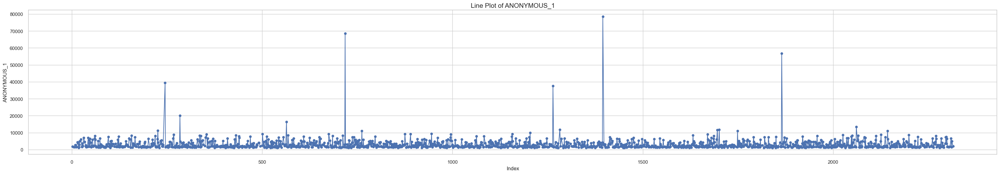

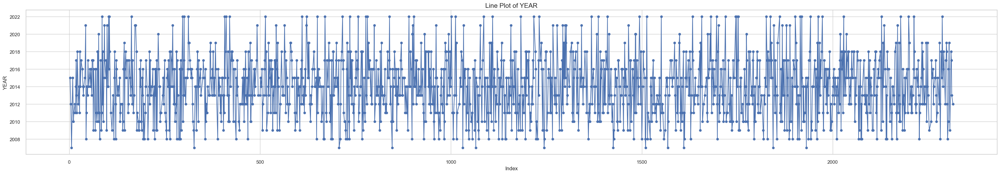

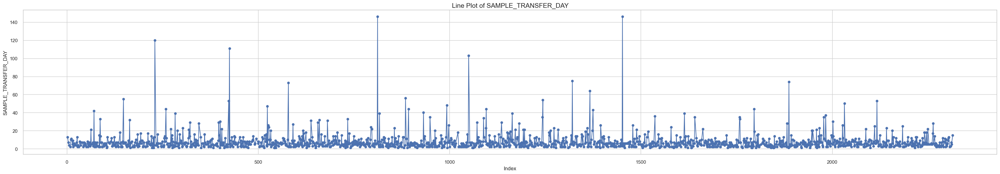

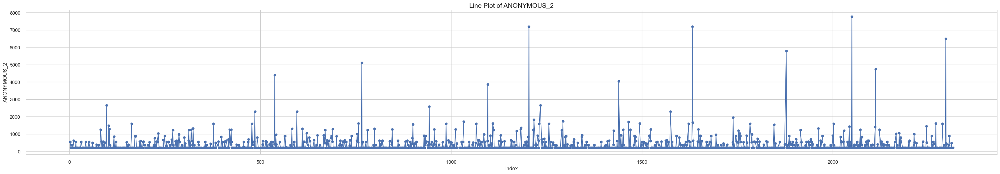

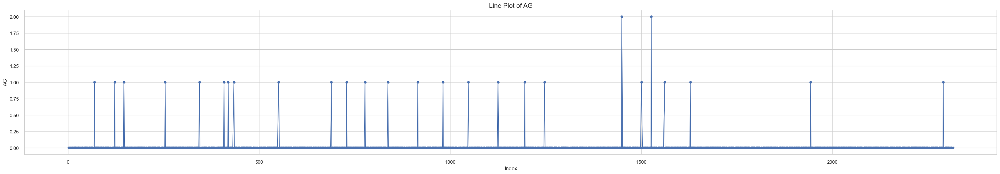

...

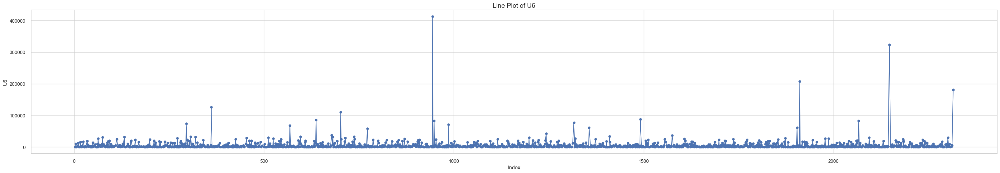

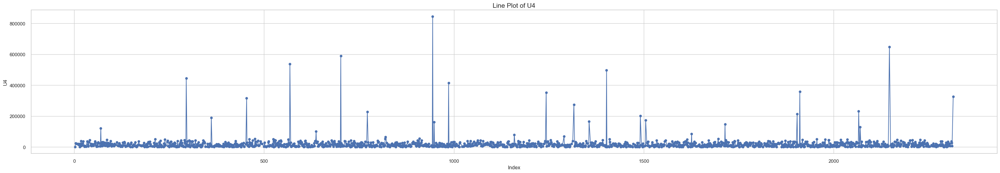

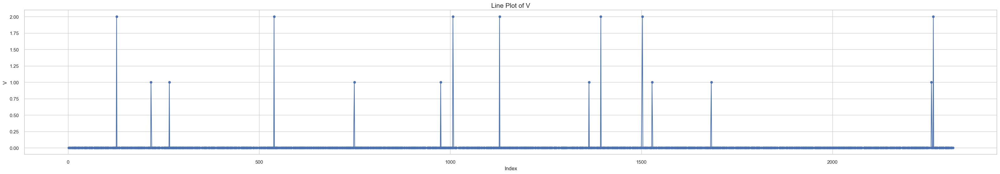

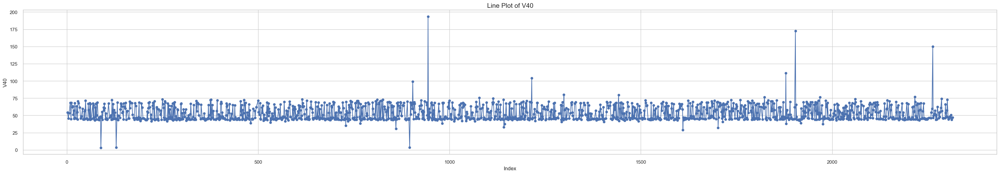

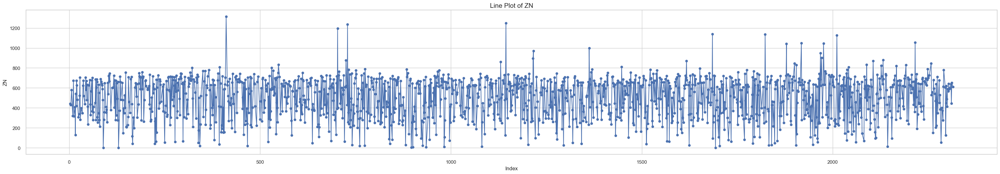

In [186]:
import pandas as pd
import matplotlib.pyplot as plt

# 데이터 로드 (train_COMPONENT2_new를 이미 로드했다고 가정)
# 예: train_COMPONENT2_new = pd.read_csv('your_dataset.csv')

# 각 열을 라인 그래프로 시각화
for column in train_COMPONENT2_new.columns:
    plt.figure(figsize=(40, 6))
    
    # 라인 그래프 그리기
    plt.plot(train_COMPONENT2_new.index, train_COMPONENT2_new[column], marker='o', linestyle='-')
    
    # 제목 및 라벨 설정
    plt.title(f'Line Plot of {column}', fontsize=15)
    plt.xlabel('Index', fontsize=12)
    plt.ylabel(column, fontsize=12)
    
    # 그래프 보여주기
    plt.grid(True)
    plt.show()


#### 🧐 컴포넌트2 폐유 히스토그램

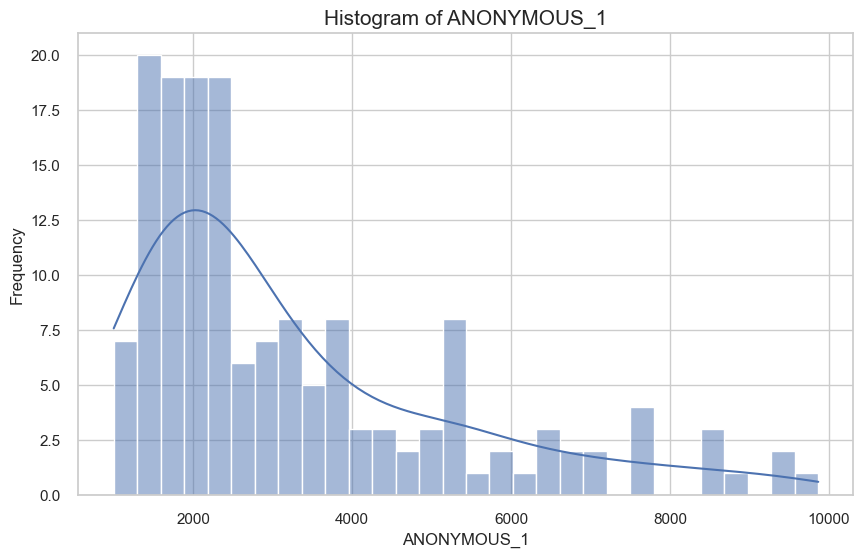

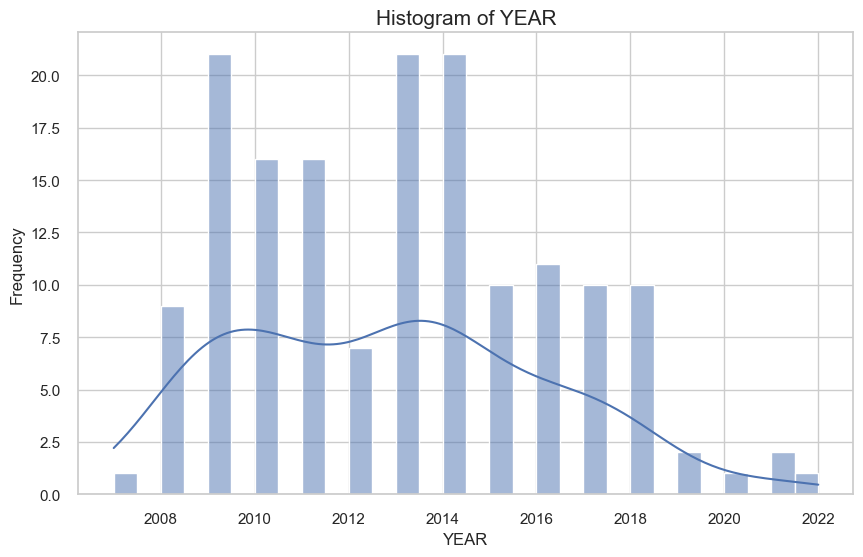

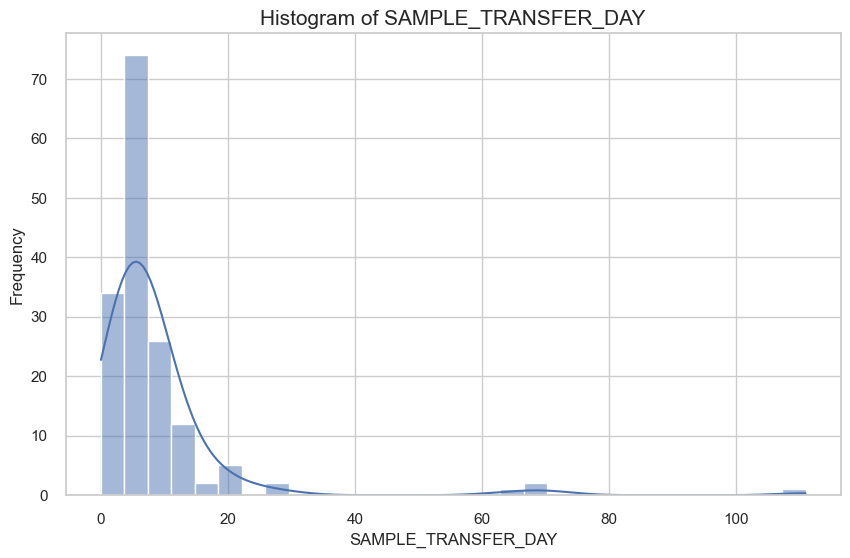

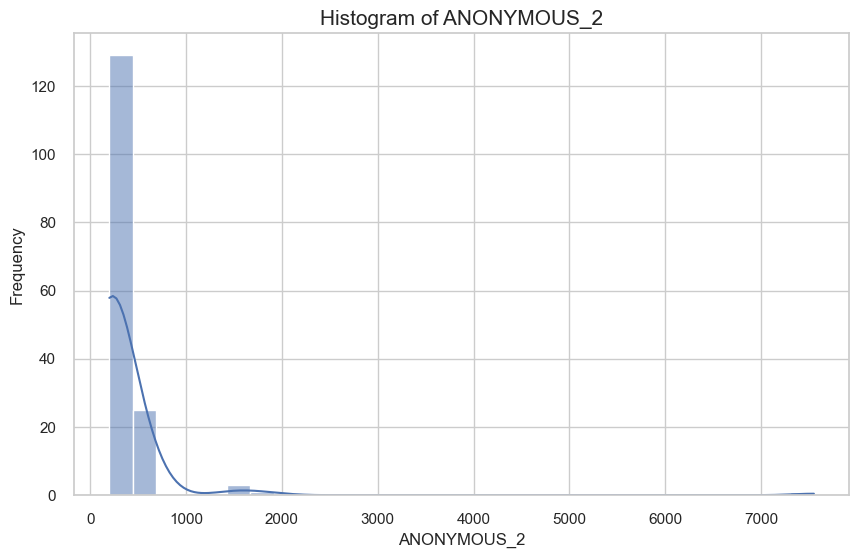

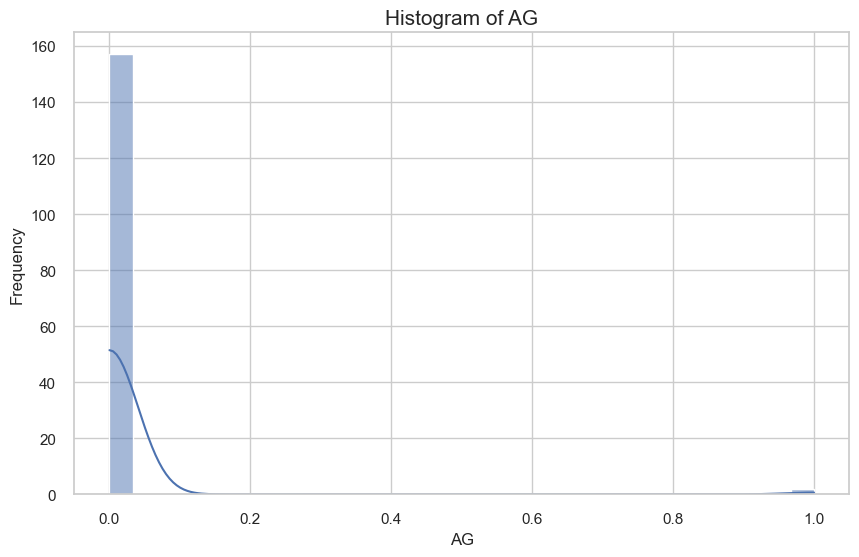

...

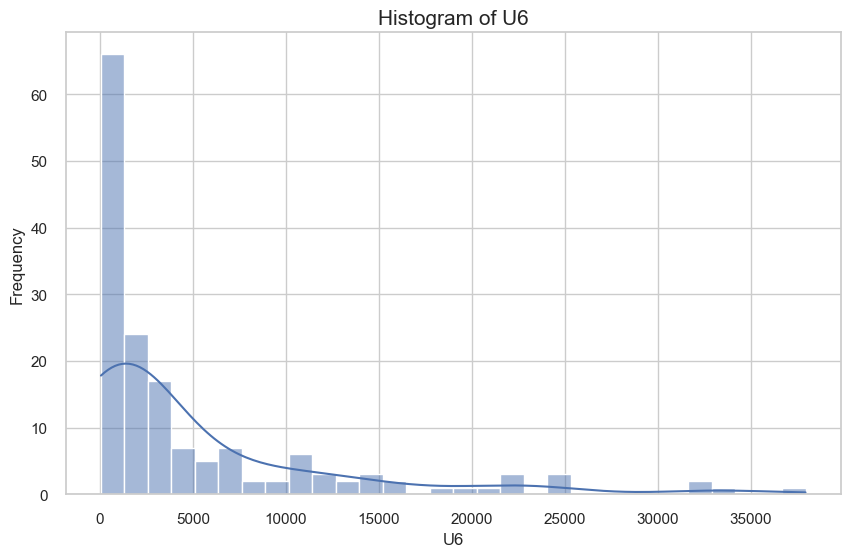

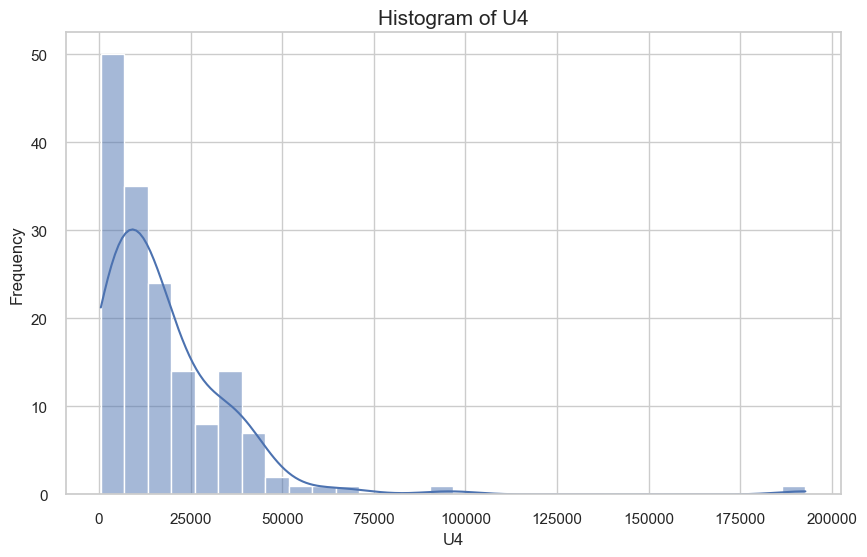

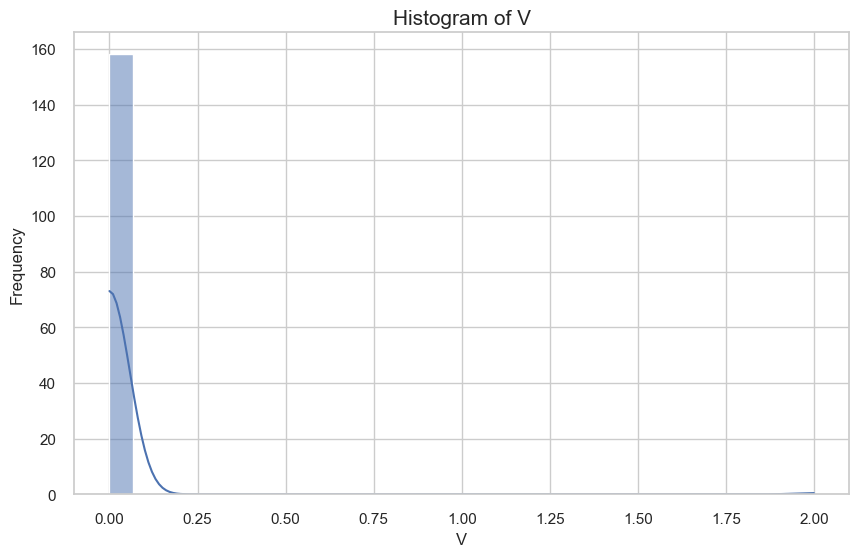

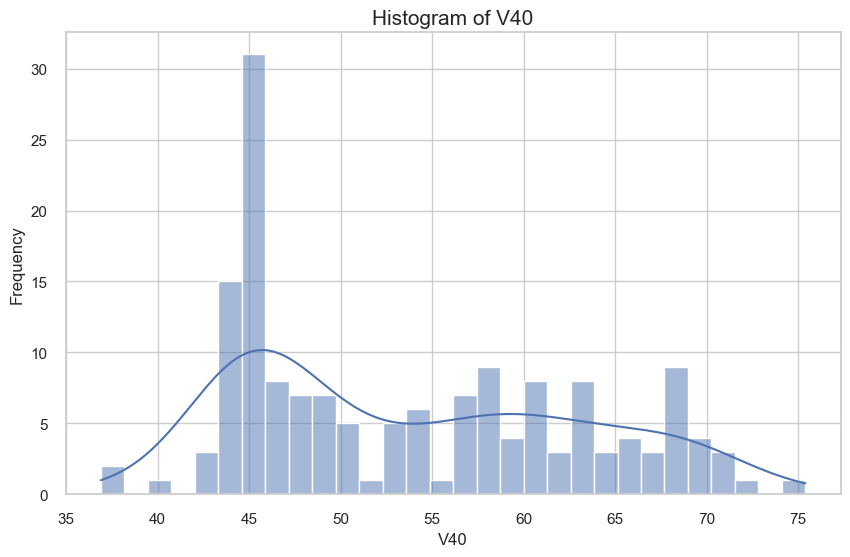

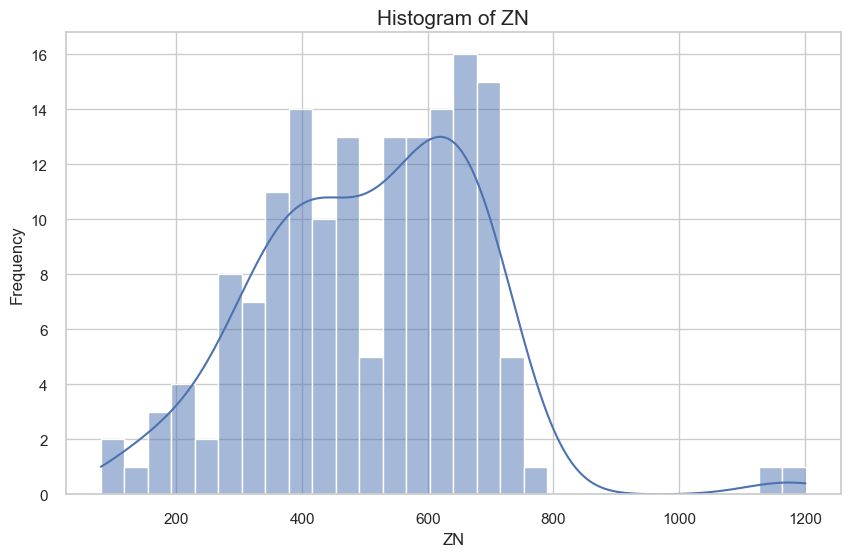

In [110]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 그래프 스타일 설정
sns.set(style="whitegrid")

# 각 열을 히스토그램으로 시각화
for column in train_COMPONENT2_old.columns:
    plt.figure(figsize=(10, 6))
    
    # 히스토그램 그리기
    sns.histplot(train_COMPONENT2_old[column], kde=True, bins=30)
    
    # 제목 및 라벨 설정
    plt.title(f'Histogram of {column}', fontsize=15)
    plt.xlabel(column, fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    
    # 그래프 보여주기
    plt.show()


#### 🧐 컴포넌트2 폐유 값들

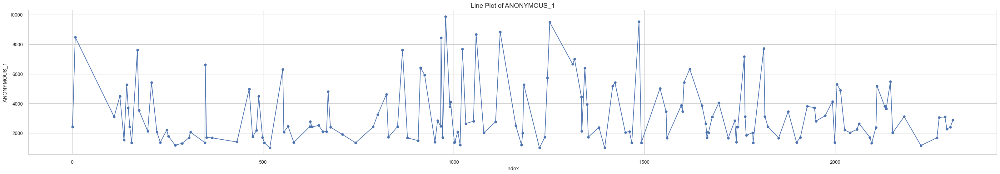

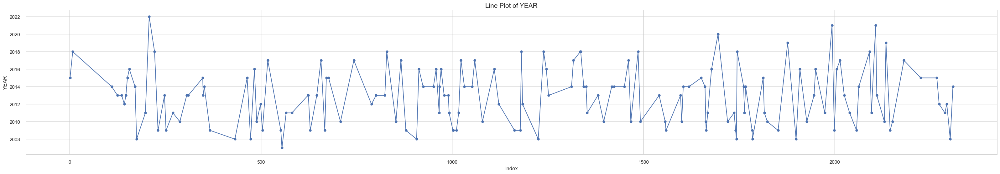

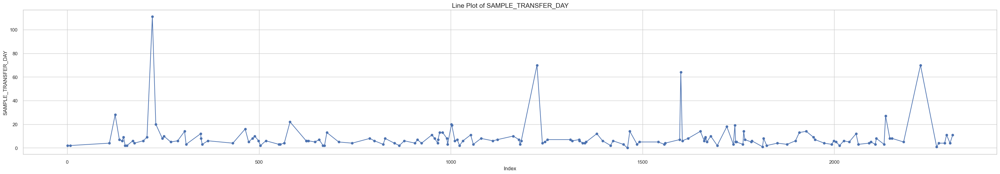

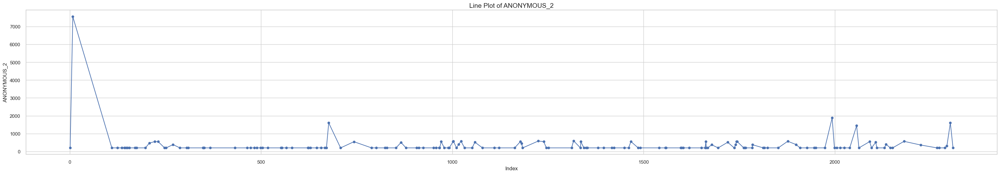

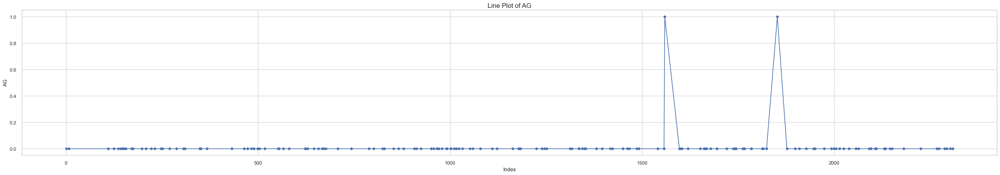

...

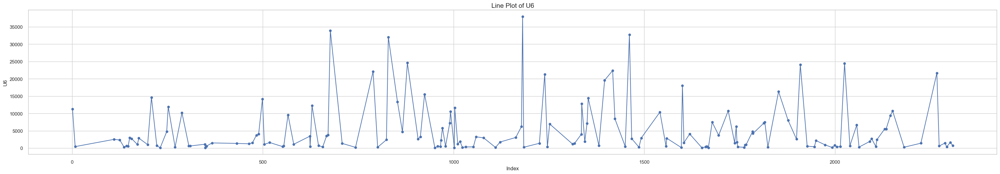

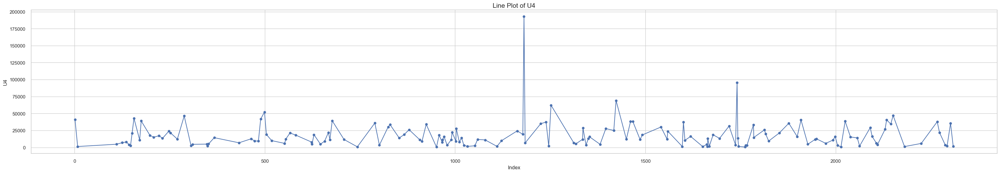

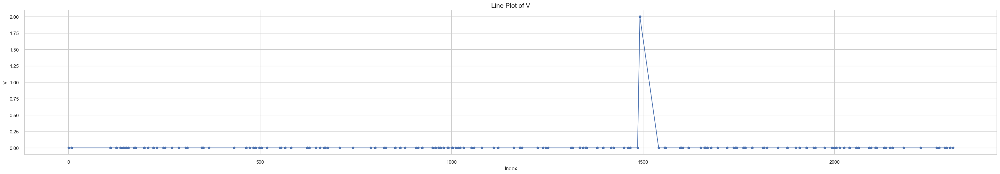

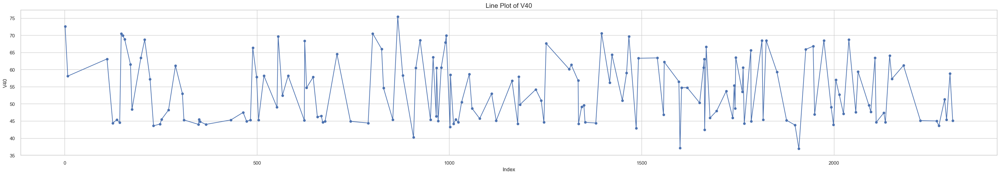

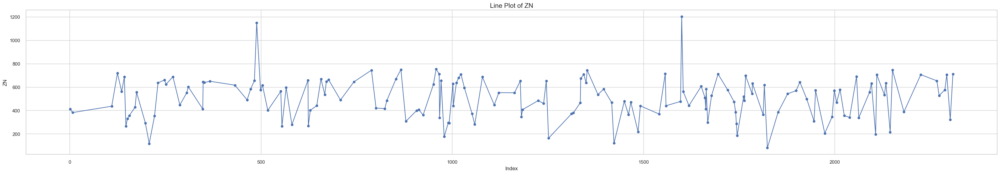

In [111]:
import pandas as pd
import matplotlib.pyplot as plt

# 각 열을 라인 그래프로 시각화
for column in train_COMPONENT2_old.columns:
    plt.figure(figsize=(40, 6))
    
    # 라인 그래프 그리기
    plt.plot(train_COMPONENT2_old.index, train_COMPONENT2_old[column], marker='o', linestyle='-')
    
    # 제목 및 라벨 설정
    plt.title(f'Line Plot of {column}', fontsize=15)
    plt.xlabel('Index', fontsize=12)
    plt.ylabel(column, fontsize=12)
    
    # 그래프 보여주기
    plt.grid(True)
    plt.show()


### 😎 불량 정상 시각화

In [197]:
train_COMPONENT1 = pd.read_csv("train_COMPONENT1.csv")
train_COMPONENT2 = pd.read_csv("train_COMPONENT2.csv")
train_COMPONENT3 = pd.read_csv("train_COMPONENT3.csv")
train_COMPONENT4 = pd.read_csv("train_COMPONENT4.csv")

#### 전처리 전

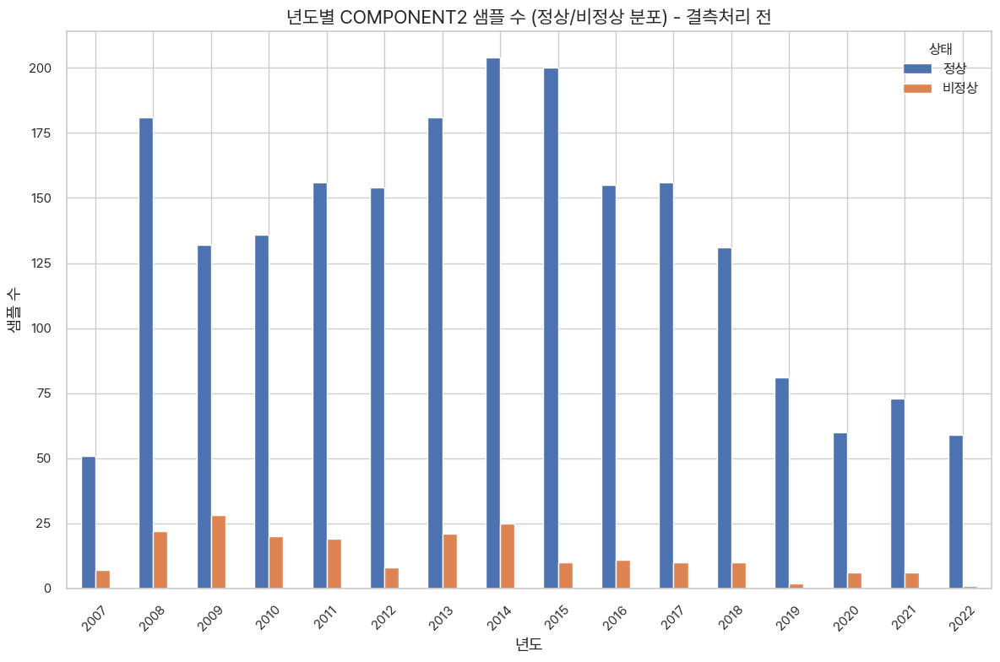

In [198]:
# Group by year and Y_LABEL, and count occurrences
year_label_counts = train_COMPONENT2.groupby(['YEAR', 'Y_LABEL']).size().unstack(fill_value=0)

# Plotting the data
import matplotlib.pyplot as plt
plt.rcParams['font.family'] ='Pretendard JP'
plt.rcParams['axes.unicode_minus'] =False

fig, ax = plt.subplots(figsize=(12, 8))


# Create a bar plot with side-by-side bars
year_label_counts.plot(kind='bar', ax=ax)
ax.set_title('년도별 COMPONENT2 샘플 수 (정상/비정상 분포) - 결측처리 전', fontsize=16)
ax.set_xlabel('년도', fontsize=14)
ax.set_ylabel('샘플 수', fontsize=14)
ax.legend(['정상', '비정상'], title='상태', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### 전처리 후

In [191]:
train_COMPONENT1 = pd.read_csv("train_COMPONENT1.csv")
train_COMPONENT2 = pd.read_csv("train_COMPONENT2.csv")
train_COMPONENT3 = pd.read_csv("train_COMPONENT3.csv")
train_COMPONENT4 = pd.read_csv("train_COMPONENT4.csv")

In [192]:
# 결측값 비율 계산
missing_ratio1 = train_COMPONENT1.isnull().mean()
missing_ratio2 = train_COMPONENT2.isnull().mean()
missing_ratio3 = train_COMPONENT3.isnull().mean()
missing_ratio4 = train_COMPONENT4.isnull().mean()

# 결측치 비율이 50% 이상인 변수 식별
columns_to_drop1 = missing_ratio1[missing_ratio1 >= 0.5].index.tolist()
columns_to_drop2 = missing_ratio2[missing_ratio2 >= 0.5].index.tolist()
columns_to_drop3 = missing_ratio3[missing_ratio3 >= 0.5].index.tolist()
columns_to_drop4 = missing_ratio4[missing_ratio4 >= 0.5].index.tolist()

# 해당 변수들을 데이터프레임에서 삭제
train_COMPONENT1 = train_COMPONENT1.drop(columns=columns_to_drop1)
train_COMPONENT2 = train_COMPONENT2.drop(columns=columns_to_drop2)
train_COMPONENT3 = train_COMPONENT3.drop(columns=columns_to_drop3)
train_COMPONENT4 = train_COMPONENT4.drop(columns=columns_to_drop4)

In [193]:
train_COMPONENT1 = train_COMPONENT1.dropna(subset=train_COMPONENT1.columns[train_COMPONENT1.isnull().any()])
train_COMPONENT2 = train_COMPONENT2.dropna(subset=train_COMPONENT2.columns[train_COMPONENT2.isnull().any()])
train_COMPONENT3 = train_COMPONENT3.dropna(subset=train_COMPONENT3.columns[train_COMPONENT3.isnull().any()])
train_COMPONENT4 = train_COMPONENT4.dropna(subset=train_COMPONENT4.columns[train_COMPONENT4.isnull().any()])

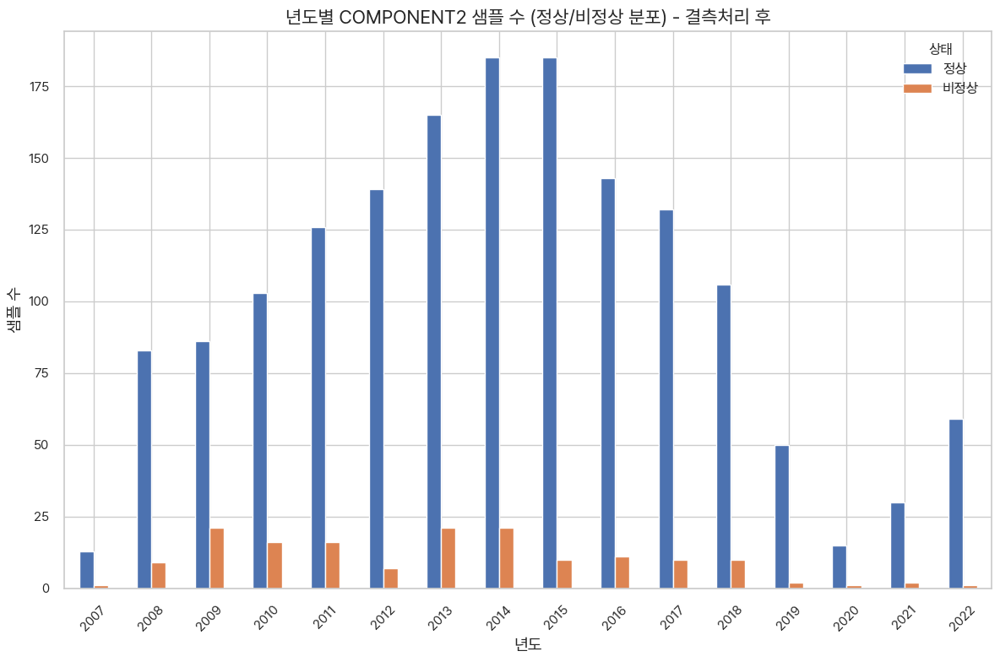

In [196]:
# Group by year and Y_LABEL, and count occurrences
year_label_counts = train_COMPONENT2.groupby(['YEAR', 'Y_LABEL']).size().unstack(fill_value=0)

# Plotting the data
import matplotlib.pyplot as plt
plt.rcParams['font.family'] ='Pretendard JP'
plt.rcParams['axes.unicode_minus'] =False

fig, ax = plt.subplots(figsize=(12, 8))


# Create a bar plot with side-by-side bars
year_label_counts.plot(kind='bar', ax=ax)
ax.set_title('년도별 COMPONENT2 샘플 수 (정상/비정상 분포) - 결측처리 후', fontsize=16)
ax.set_xlabel('년도', fontsize=14)
ax.set_ylabel('샘플 수', fontsize=14)
ax.legend(['정상', '비정상'], title='상태', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()